# Importing the dependencies

In [3]:
import os
import torch
import torchvision
import tarfile
import torch.nn as nn
import numpy as np
import random
from tqdm import tqdm
import pandas as pd
import seaborn as sns
import torch.nn.functional as F
from PIL import Image
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import ConcatDataset
from torchvision.utils import make_grid
from torchsummary import summary
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, confusion_matrix, roc_curve, precision_score, recall_score, f1_score
import torchvision.models as models
import warnings
warnings.filterwarnings("ignore")
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as tt
from torch.utils.data import random_split
from torchvision.utils import make_grid
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

matplotlib.rcParams['figure.facecolor'] = '#ffffff'

# Data Understanding

In [22]:
number_of_samples_per_class = {}

In [25]:
path = r'C:\Users\Flower Classification\Train'

In [26]:
n_classes = os.listdir(path)
print("The total number of classes present in the dataset are: {}\nand they are: {}".format(len(n_classes), n_classes))

The total number of classes present in the dataset are: 5
and they are: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


## `daisy` Class

daisy
Image Shape:  (333, 500, 3)


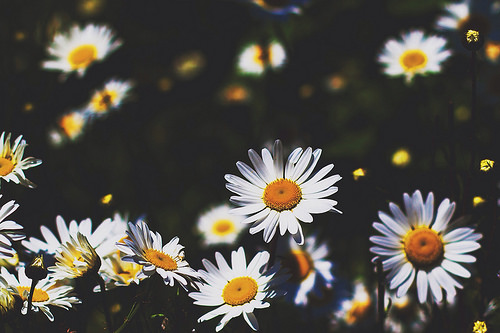

In [9]:
sample1 = os.listdir(path+'/daisy')[0]
sample1 = os.path.join(path+"/daisy", sample1)

print("daisy")
daisy = Image.open(sample1)
print("Image Shape: ", np.array(daisy).shape)
daisy

In [10]:
number_of_samples_in_daisy_class = len(os.listdir(path+'/daisy'))

In [11]:
print("There are a total of {} number of samples in {} class.".format(number_of_samples_in_daisy_class, 'daisy'))

There are a total of 763 number of samples in daisy class.


In [12]:
number_of_samples_per_class['daisy'] = number_of_samples_in_daisy_class

16 Random daisy image samples plot


16it [00:00, 221.19it/s]


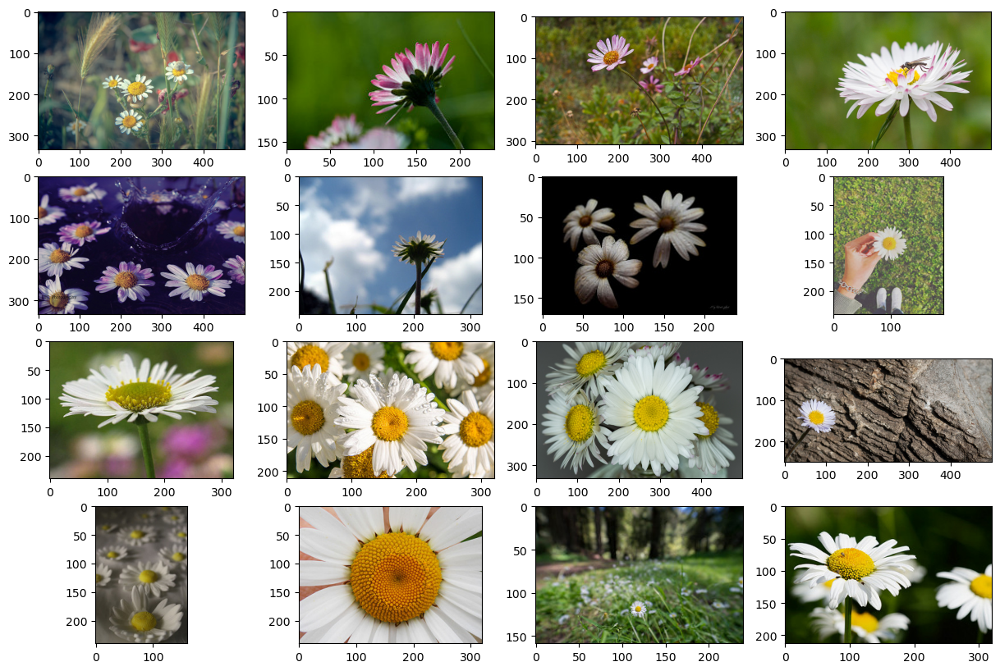

In [13]:
sixteen_daisy_samples = random.sample(os.listdir(path+'/daisy'), 16)

fig, axes = plt.subplots(4, 4, figsize=(15, 10))

print("16 Random daisy image samples plot")
for i, img in tqdm(enumerate(sixteen_daisy_samples)):
    ax1 = plt.subplot(4, 4, i+1)
    sample1 = os.path.join(path+"/daisy", img)
    sample1 = Image.open(sample1)
    ax1.imshow(sample1)

## `For dandelion class`

dandelion
Image Shape:  (180, 240, 3)


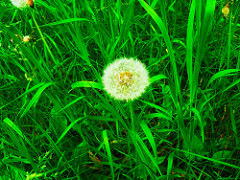

In [14]:
sample1 = os.listdir(path+'/dandelion')[0]
sample1 = os.path.join(path+"/dandelion", sample1)

print("dandelion")
dandelion = Image.open(sample1)
print("Image Shape: ", np.array(dandelion).shape)
dandelion

In [15]:
number_of_samples_in_dandelion_class = len(os.listdir(path+'/dandelion'));number_of_samples_in_dandelion_class

1051

In [16]:
number_of_samples_per_class['dandelion'] = number_of_samples_in_dandelion_class

16 Random dandelion image samples plot


16it [00:00, 233.37it/s]


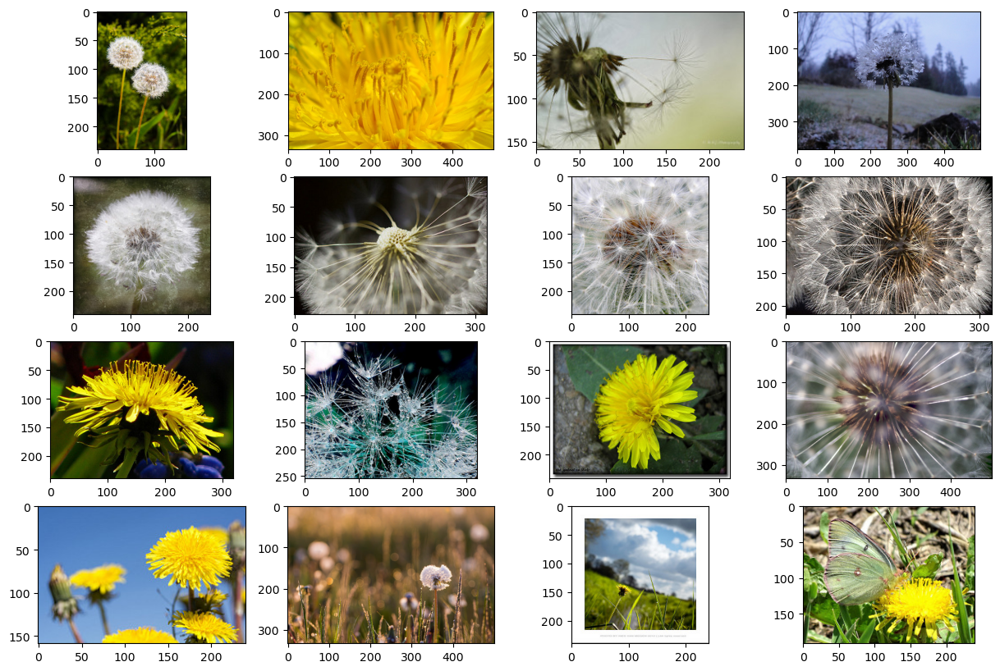

In [17]:
sixteen_dandelion_samples = random.sample(os.listdir(path+'/dandelion'), 16)

fig, axes = plt.subplots(4, 4, figsize=(15, 10))

print("16 Random dandelion image samples plot")
for i, img in tqdm(enumerate(sixteen_dandelion_samples)):
    ax1 = plt.subplot(4, 4, i+1)
    sample1 = os.path.join(path+"/dandelion", img)
    sample1 = Image.open(sample1)
    ax1.imshow(sample1)

## `For rose class `

rose
Image Shape:  (325, 500, 3)


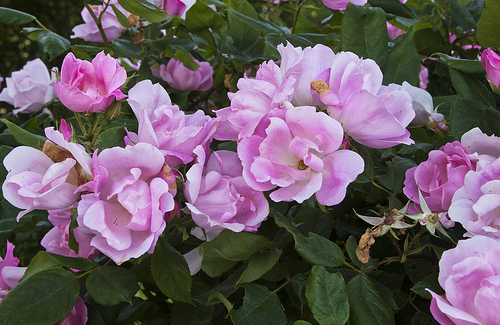

In [18]:
sample1 = os.listdir(path+'/rose')[0]
sample1 = os.path.join(path+"/rose", sample1)

print("rose")
rose = Image.open(sample1)
print("Image Shape: ", np.array(rose).shape)
rose

In [19]:
number_of_samples_in_rose_class = len(os.listdir(path+'/rose'));number_of_samples_in_rose_class

783

In [20]:
number_of_samples_per_class['rose'] = number_of_samples_in_rose_class

16 Random rose image samples plot


16it [00:00, 239.55it/s]


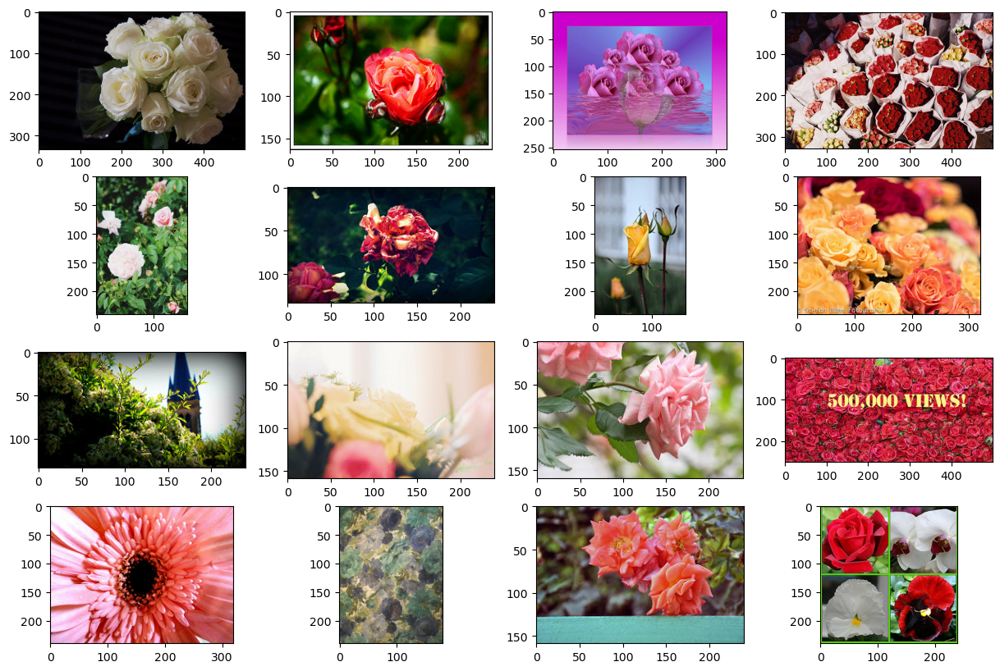

In [21]:
sixteen_rose_samples = random.sample(os.listdir(path+'/rose'), 16)
fig, axes = plt.subplots(4, 4, figsize=(15, 10))

print("16 Random rose image samples plot")
for i, img in tqdm(enumerate(sixteen_rose_samples)):
    ax1 = plt.subplot(4, 4, i+1)
    sample1 = os.path.join(path+"/rose", img)
    sample1 = Image.open(sample1)
    ax1.imshow(sample1)

## `For sunflower class`

sunflower
Image Shape:  (240, 320, 3)


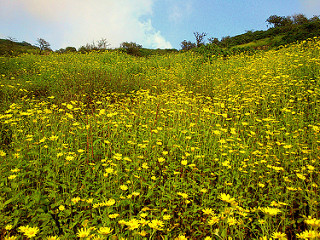

In [22]:
sample1 = os.listdir(path+'/sunflower')[0]
sample1 = os.path.join(path+"/sunflower", sample1)

print("sunflower")
sunflower = Image.open(sample1)
print("Image Shape: ", np.array(sunflower).shape)
sunflower

In [23]:
number_of_samples_in_sunflower_class = len(os.listdir(path+'/sunflower'));number_of_samples_in_sunflower_class

732

In [24]:
number_of_samples_per_class['sunflower'] = number_of_samples_in_sunflower_class

16 Random sunflower image samples plot


16it [00:00, 185.72it/s]


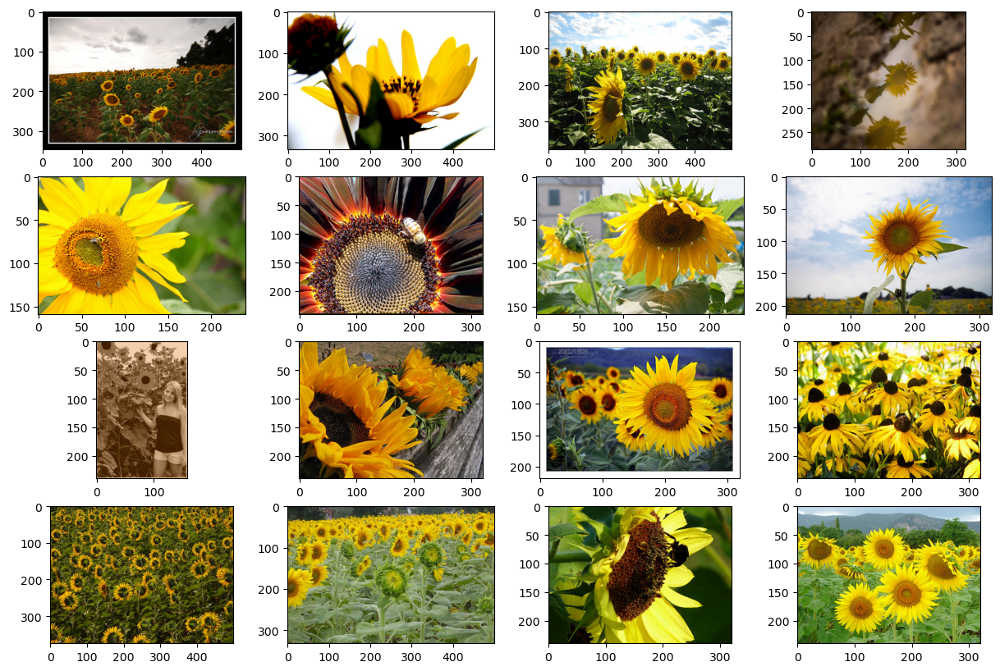

In [25]:
sixteen_sunflower_samples = random.sample(os.listdir(path+'/sunflower'), 16)

fig, axes = plt.subplots(4, 4, figsize=(15, 10))

print("16 Random sunflower image samples plot")
for i, img in tqdm(enumerate(sixteen_sunflower_samples)):
    ax1 = plt.subplot(4, 4, i+1)
    sample1 = os.path.join(path+"/sunflower", img)
    sample1 = Image.open(sample1)
    ax1.imshow(sample1)

## `For tulip class`

tulip
Image Shape:  (249, 320, 3)


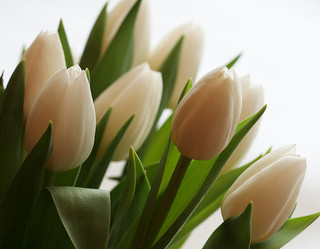

In [26]:
sample1 = os.listdir(path+'/tulip')[0]
sample1 = os.path.join(path+"/tulip", sample1)

print("tulip")
tulip = Image.open(sample1)
print("Image Shape: ", np.array(tulip).shape)
tulip

In [27]:
number_of_samples_in_tulip_class = len(os.listdir(path+'/tulip'));number_of_samples_in_tulip_class

983

In [28]:
number_of_samples_per_class['tulip'] = number_of_samples_in_tulip_class

16 Random tulip image samples plot


16it [00:00, 202.03it/s]


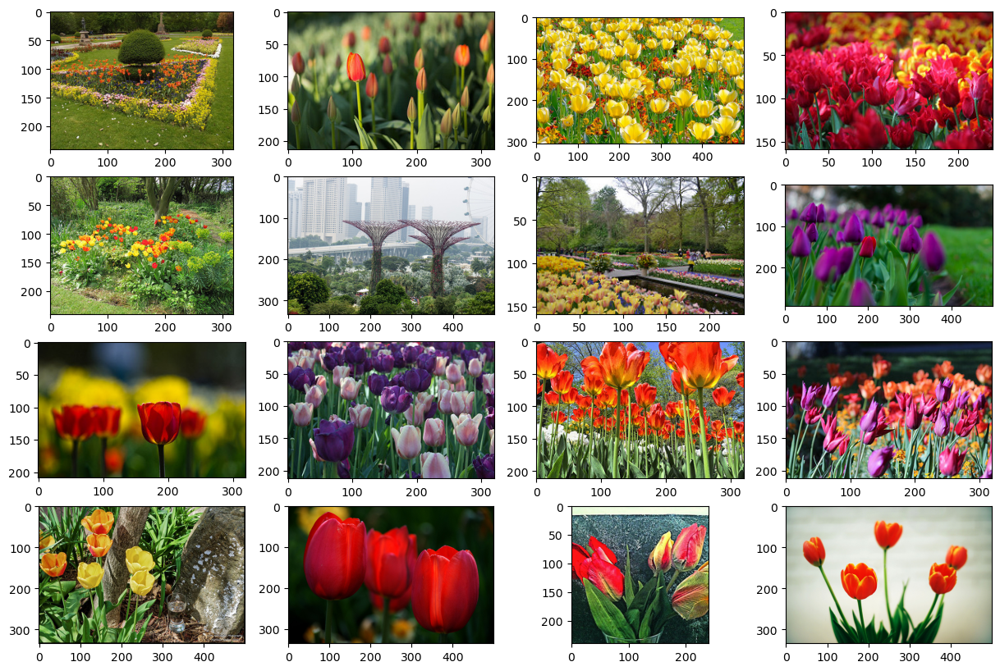

In [29]:
sixteen_tulip_samples = random.sample(os.listdir(path+'/tulip'), 16)

fig, axes = plt.subplots(4, 4, figsize=(15, 10))

print("16 Random tulip image samples plot")
for i, img in tqdm(enumerate(sixteen_tulip_samples)):
    ax1 = plt.subplot(4, 4, i+1)
    sample1 = os.path.join(path+"/tulip", img)
    sample1 = Image.open(sample1)
    ax1.imshow(sample1)

In [30]:
number_of_samples = pd.DataFrame(np.array(list(number_of_samples_per_class.values()))).T
number_of_samples.columns = list(number_of_samples_per_class.keys())
number_of_samples

,daisy,dandelion,rose,sunflower,tulip
0,763,1051,783,732,983


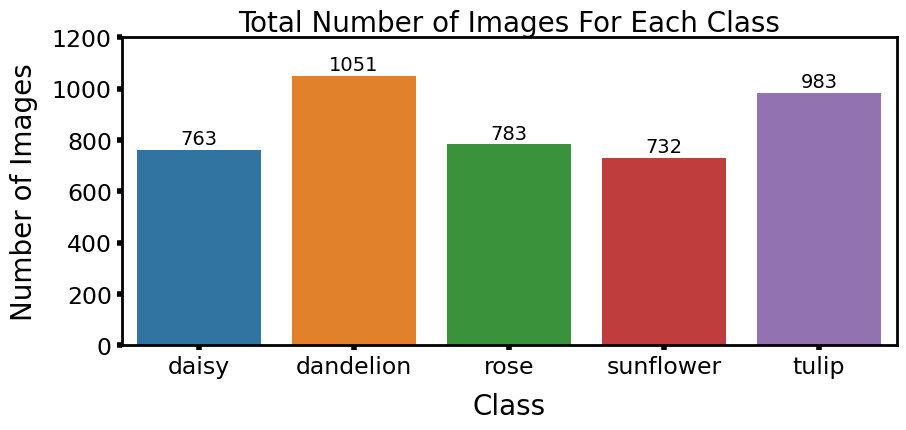

In [31]:
fig, axes = plt.subplots(1, 1, figsize=(10, 4))

ax1 = plt.subplot(1,1,1)
sns.barplot(y = list(number_of_samples_per_class.values()), x = list(number_of_samples_per_class.keys()),\
           ax = ax1)

ax1.text(0.5, 1.02, "Total Number of Images For Each Class",
    horizontalalignment='center',
    fontsize=20,
    transform = ax1.transAxes);

ax1.set_ylim([0, 1200])

for i, bar in enumerate(ax1.containers):
    ax1.bar_label(bar, label_type='edge', fontsize=14, padding=1, labels=[list(number_of_samples_per_class.values())[i]])


ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black') 
ax1.spines['right'].set_color('black')
ax1.spines['right'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_lw(2)

ax1.set_ylabel('Number of Images', fontsize = 20, labelpad = 10, fontweight = 'normal')
ax1.set_xlabel('Class', fontsize = 20, labelpad = 10, fontweight = 'normal')

ax1.tick_params(axis ='both', labelcolor = 'black',labelsize=17, width=4) 

In [32]:
total_images_in_dataset = sum(list(number_of_samples_per_class.values()))
print("Total Images in Dataset is: {}".format(total_images_in_dataset))

Total Images in Dataset is: 4312


## `Calculating Mean and Standard Deviation for each Channel`

In [33]:
image_size = (224, 224)
batch_size = 64
CHANNELS_IMG = 3

In [34]:
dataset = ImageFolder(path, transform=tt.Compose([
                                        tt.Resize(image_size),
                                        tt.ToTensor()]))

dataset_dl = DataLoader(dataset, batch_size, shuffle=True, num_workers=4, pin_memory=True)

In [35]:
len(dataset)

4312

In [36]:
def get_mean_and_std(dataloader):
    channels_sum, channels_squared_sum, num_batches = 0, 0, 0
    for data, _ in tqdm(dataloader):
        
        channels_sum += torch.mean(data, dim=[0,2,3])
        channels_squared_sum += torch.mean(data**2, dim=[0,2,3])
        num_batches += 1
    
    mean = channels_sum / num_batches

    std = (channels_squared_sum / num_batches - mean ** 2) ** 0.5

    return mean, std

In [36]:
mean, std = get_mean_and_std(dataset_dl)

100%|██████████| 68/68 [00:12<00:00,  5.30it/s]


In [37]:
print("The calculated mean is: ", mean)
print("The calculated standard deviation is: ", std)

The calculated mean is:  tensor([0.4588, 0.4198, 0.3006])
The calculated standard deviation is:  tensor([0.2941, 0.2635, 0.2864])


In [37]:
mean = [0.4588, 0.4198, 0.3006]
std = [0.2941, 0.2635, 0.2864]

## `Train, Validation and Test Datasets`

### Creating Datasets

In [38]:
image_size = (224, 224)
CHANNELS_IMG = 3

In [39]:
random_seed = 42
torch.manual_seed(random_seed);

In [40]:
transformations_to_perform = transform=tt.Compose([
                                tt.Resize(image_size),
                                tt.ToTensor(),
                                tt.Normalize(mean, std)])


train_ds = ImageFolder(path, transformations_to_perform)

In [42]:
classes = train_ds.classes;classes

['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

In [44]:
train_sample_size = int(len(train_ds) * 0.6)
valid_sample_size = int(len(train_ds) * 0.2)
test_sample_size  = int(len(train_ds) * 0.2)

In [46]:
from torch.utils.data import random_split

train_val_ds, test_ds = random_split(train_ds, [train_sample_size + valid_sample_size+ 1, test_sample_size])

train_ds, val_ds = random_split(train_val_ds, [len(train_val_ds)-valid_sample_size, valid_sample_size])

print(f"Training set size: {len(train_ds)}")
print(f"Validation set size: {len(val_ds)}")
print(f"Test set size: {len(test_ds)}")


Training set size: 2588
Validation set size: 862
Test set size: 862


In [48]:
from collections import defaultdict

class_counts = defaultdict(int)

for x, y in train_ds:
    class_counts[y] += 1

for c, count in class_counts.items():
    print(f"Class {c}: {count} samples")


Class 3: 443 samples
Class 2: 469 samples
Class 1: 634 samples
Class 0: 454 samples
Class 4: 588 samples


In [50]:
sorted_dict = dict(sorted(dict(class_counts).items()));sorted_dict

{0: 454, 1: 634, 2: 469, 3: 443, 4: 588}

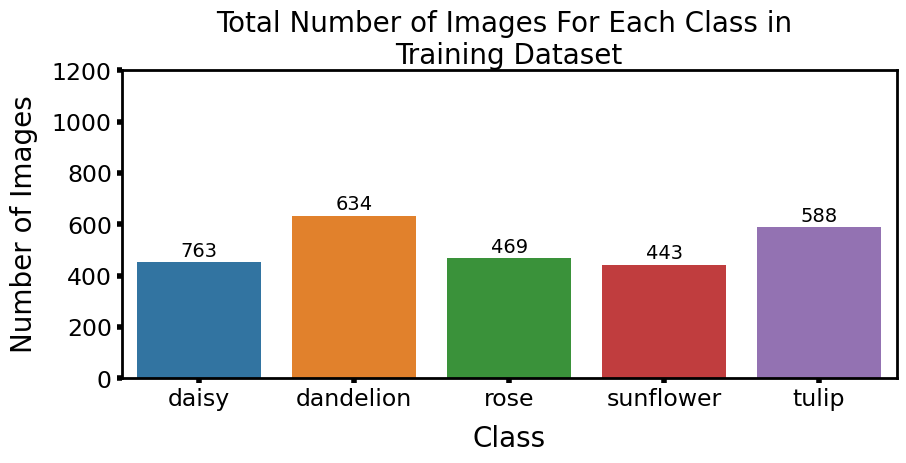

In [52]:
fig, axes = plt.subplots(1, 1, figsize=(10, 4))

ax1 = plt.subplot(1,1,1)
sns.barplot(y = list(sorted_dict.values()), x = [classes[i] for i in list(sorted_dict.keys())],\
           ax = ax1)

ax1.text(0.5, 1.02, "Total Number of Images For Each Class in \nTraining Dataset",
    horizontalalignment='center',
    fontsize=20,
    transform = ax1.transAxes);

ax1.set_ylim([0, 1200])

for i, bar in enumerate(ax1.containers):
    ax1.bar_label(bar, label_type='edge', fontsize=14, padding=1, labels=[list(number_of_samples_per_class.values())[i]])


# set various colors
ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black') 
ax1.spines['right'].set_color('black')
ax1.spines['right'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_lw(2)

ax1.set_ylabel('Number of Images', fontsize = 20, labelpad = 10, fontweight = 'normal')
ax1.set_xlabel('Class', fontsize = 20, labelpad = 10, fontweight = 'normal')

ax1.tick_params(axis ='both', labelcolor = 'black',labelsize=17, width=4) 

In [53]:
def denormalize(images, means, stds):
    means = torch.tensor(means).reshape(1, 3, 1, 1)
    stds = torch.tensor(stds).reshape(1, 3, 1, 1)
    return images * stds + means

def show_dataset(dataset, batch_size=25):
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)

    for images, labels in dataloader:
        fig, ax = plt.subplots(figsize=(8, 5))
        ax.set_xticks([]); ax.set_yticks([])
        denorm_images = denormalize(images, mean, std)
        ax.imshow(make_grid(denorm_images, nrow=5).permute(1, 2, 0))
        break

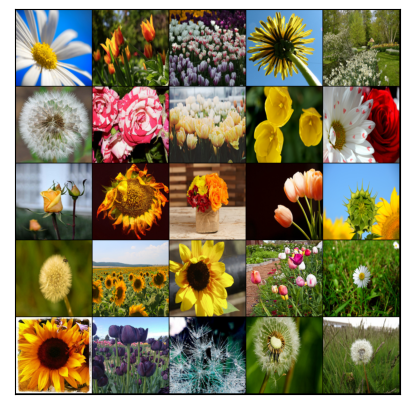

In [54]:
show_dataset(train_ds)

In [55]:
class CreateTransformedDataset(Dataset):
    def __init__(self, my_list):
        self.data = my_list

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image, label = self.data[idx]
        return image, label

In [56]:
train_ds_RandomHorizontalFlip = train_ds
transform = tt.RandomHorizontalFlip(p=1)

transformed_data = [(transform(image), label) for image, label in tqdm(train_ds_RandomHorizontalFlip)]
train_ds_RandomHorizontalFlip = CreateTransformedDataset(transformed_data)

100%|██████████| 2588/2588 [00:11<00:00, 219.95it/s]


Text(0.5, 1.0, 'Horizontal Flipped Image')

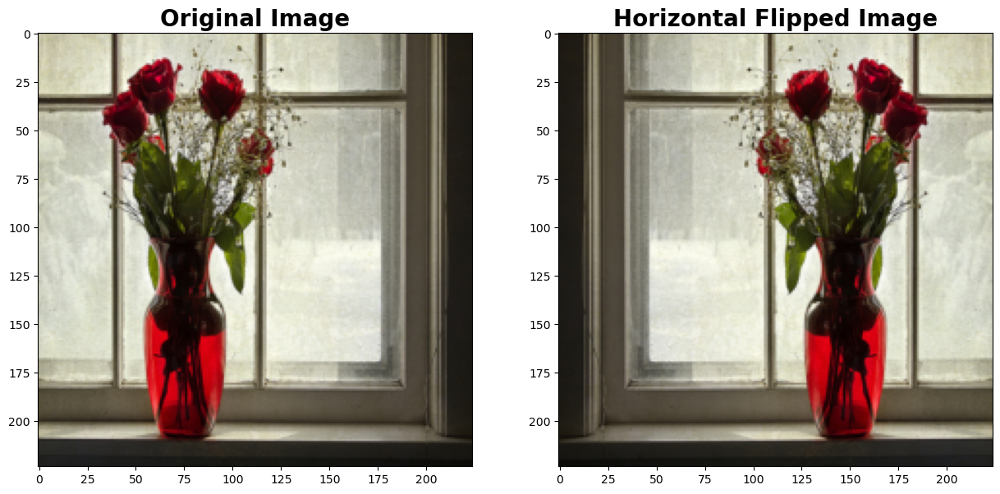

In [57]:
fig, axes = plt.subplots(1, 2, figsize=(15, 20))

ax = plt.subplot(1, 2, 1)
ax.imshow(denormalize(train_ds[250][0], mean, std)[0].permute((1, 2, 0)))
ax.set_title("Original Image", fontsize = 20, fontweight = 'bold')

ax = plt.subplot(1, 2, 2)
ax.imshow(denormalize(train_ds_RandomHorizontalFlip[250][0], mean, std)[0].permute((1, 2, 0)))
ax.set_title("Horizontal Flipped Image", fontsize = 20, fontweight = 'bold')

In [59]:
train_ds_RandomVerticalFlip = train_ds
transform = tt.RandomVerticalFlip(p=1)

transformed_data = [(transform(image), label) for image, label in tqdm(train_ds_RandomVerticalFlip)]
train_ds_RandomVerticalFlip = CreateTransformedDataset(transformed_data)

100%|██████████| 2588/2588 [00:11<00:00, 224.87it/s]


Text(0.5, 1.0, 'Vertical Flipped Image')

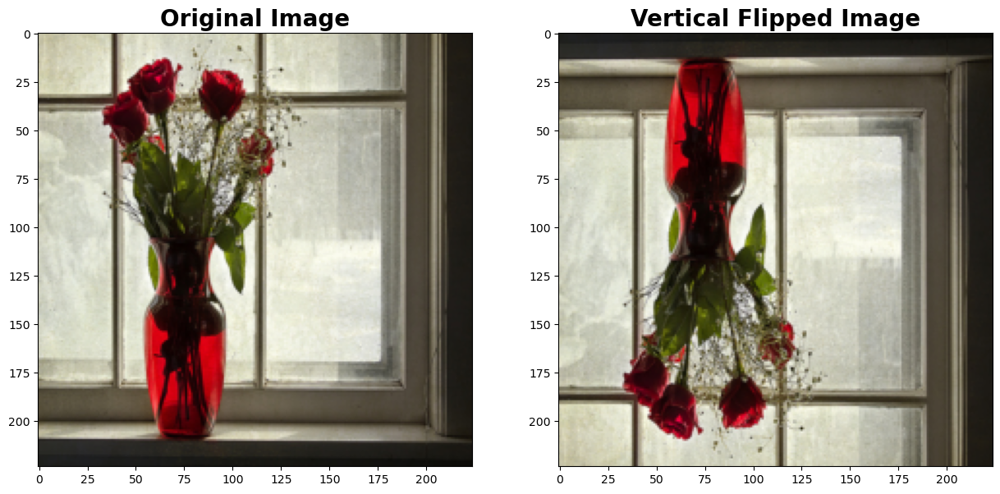

In [60]:
fig, axes = plt.subplots(1, 2, figsize=(15, 20))

ax = plt.subplot(1, 2, 1)
ax.imshow(denormalize(train_ds[250][0], mean, std)[0].permute((1, 2, 0)))
ax.set_title("Original Image", fontsize = 20, fontweight = 'bold')

ax = plt.subplot(1, 2, 2)
ax.imshow(denormalize(train_ds_RandomVerticalFlip[250][0], mean, std)[0].permute((1, 2, 0)))
ax.set_title("Vertical Flipped Image", fontsize = 20, fontweight = 'bold')

In [61]:
train_ds_RandomRotation = train_ds
transform = tt.RandomRotation(degrees = 45)

transformed_data = [(transform(image), label) for image, label in tqdm(train_ds_RandomRotation)]
train_ds_RandomRotation = CreateTransformedDataset(transformed_data)

100%|██████████| 2588/2588 [00:16<00:00, 152.74it/s]


Text(0.5, 1.0, 'Randomly Rotated Image by 45 degrees')

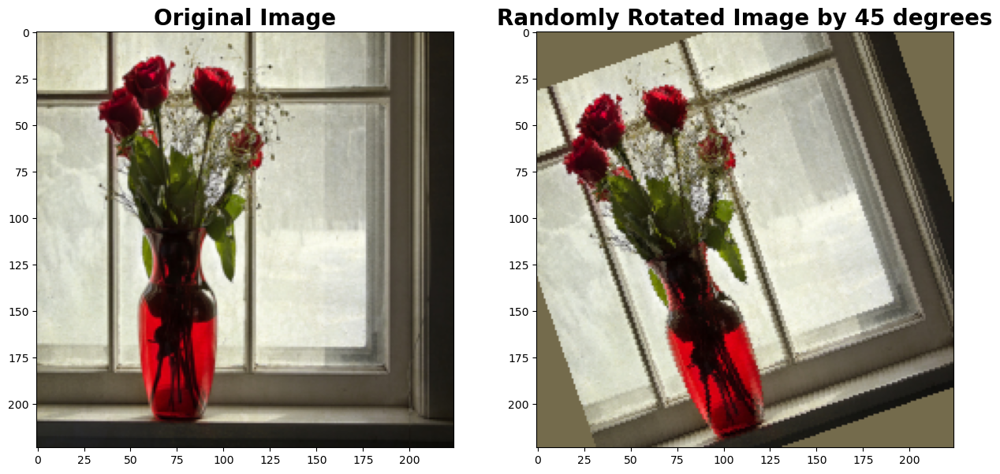

In [62]:
fig, axes = plt.subplots(1, 2, figsize=(15, 20))

ax = plt.subplot(1, 2, 1)
ax.imshow(denormalize(train_ds[250][0], mean, std)[0].permute((1, 2, 0)))
ax.set_title("Original Image", fontsize = 20, fontweight = 'bold')

ax = plt.subplot(1, 2, 2)
ax.imshow(denormalize(train_ds_RandomRotation[250][0], mean, std)[0].permute((1, 2, 0)))
ax.set_title("Randomly Rotated Image by 45 degrees", fontsize = 20, fontweight = 'bold')

In [64]:
train_ds_concatenated = ConcatDataset([train_ds, train_ds_RandomHorizontalFlip, train_ds_RandomVerticalFlip, \
                                train_ds_RandomRotation])

In [65]:
len(train_ds_concatenated)

10352

our original dataset has been scaled by 4 times

Final Augmented and Concatenated Training Dataset


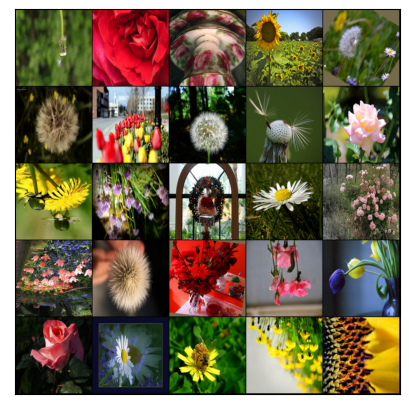

In [67]:
print("Final Augmented and Concatenated Training Dataset")
show_dataset(train_ds_concatenated)

100%|██████████| 10352/10352 [00:10<00:00, 996.95it/s]


Class 3: 1772 samples
Class 2: 1876 samples
Class 1: 2536 samples
Class 0: 1816 samples
Class 4: 2352 samples


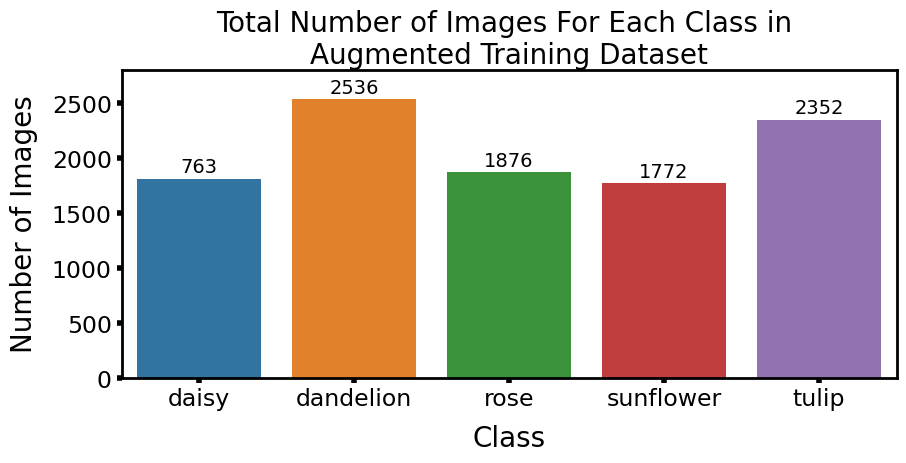

In [68]:
class_counts = defaultdict(int)

for x, y in tqdm(train_ds_concatenated):
    class_counts[y] += 1

for c, count in class_counts.items():
    print(f"Class {c}: {count} samples")

sorted_dict = dict(sorted(dict(class_counts).items()));sorted_dict

fig, axes = plt.subplots(1, 1, figsize=(10, 4))

ax1 = plt.subplot(1,1,1)
sns.barplot(y = list(sorted_dict.values()), x = [classes[i] for i in list(sorted_dict.keys())],\
           ax = ax1)

ax1.text(0.5, 1.02, "Total Number of Images For Each Class in \nAugmented Training Dataset",
    horizontalalignment='center',
    fontsize=20,
    transform = ax1.transAxes);

ax1.set_ylim([0, 2800])

for i, bar in enumerate(ax1.containers):
    ax1.bar_label(bar, label_type='edge', fontsize=14, padding=1, labels=[list(number_of_samples_per_class.values())[i]])


ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black') 
ax1.spines['right'].set_color('black')
ax1.spines['right'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_lw(2)

ax1.set_ylabel('Number of Images', fontsize = 20, labelpad = 10, fontweight = 'normal')
ax1.set_xlabel('Class', fontsize = 20, labelpad = 10, fontweight = 'normal')

ax1.tick_params(axis ='both', labelcolor = 'black',labelsize=17, width=4) 

For Validation Dataset


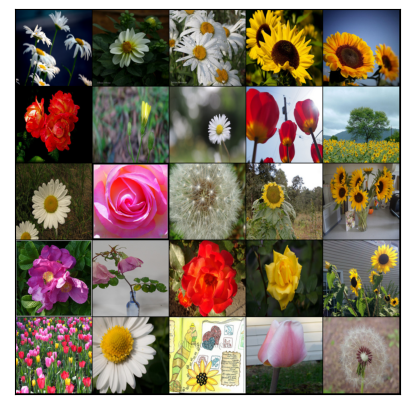

In [69]:
print("For Validation Dataset")
show_dataset(val_ds)

100%|██████████| 862/862 [00:03<00:00, 255.11it/s]


Class 4: 182 samples
Class 2: 159 samples
Class 3: 154 samples
Class 0: 152 samples
Class 1: 215 samples


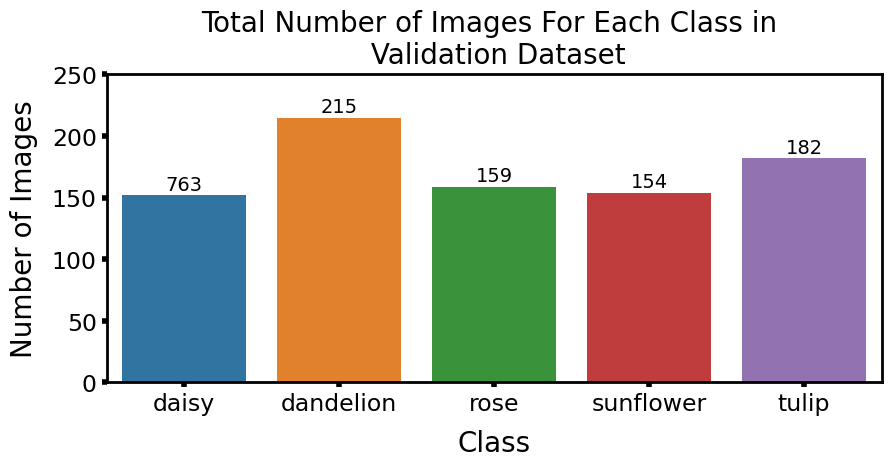

In [70]:
class_counts = defaultdict(int)

for x, y in tqdm(val_ds):
    class_counts[y] += 1

for c, count in class_counts.items():
    print(f"Class {c}: {count} samples")

sorted_dict = dict(sorted(dict(class_counts).items()));sorted_dict

fig, axes = plt.subplots(1, 1, figsize=(10, 4))

ax1 = plt.subplot(1,1,1)
sns.barplot(y = list(sorted_dict.values()), x = [classes[i] for i in list(sorted_dict.keys())],\
           ax = ax1)

ax1.text(0.5, 1.035, "Total Number of Images For Each Class in \n Validation Dataset",
    horizontalalignment='center',
    fontsize=20,
    transform = ax1.transAxes);

ax1.set_ylim([0, 250])

for i, bar in enumerate(ax1.containers):
    ax1.bar_label(bar, label_type='edge', fontsize=14, padding=1, labels=[list(number_of_samples_per_class.values())[i]])


ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black') 
ax1.spines['right'].set_color('black')
ax1.spines['right'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_lw(2)

ax1.set_ylabel('Number of Images', fontsize = 20, labelpad = 10, fontweight = 'normal')
ax1.set_xlabel('Class', fontsize = 20, labelpad = 10, fontweight = 'normal')

ax1.tick_params(axis ='both', labelcolor = 'black',labelsize=17, width=4) 

For Test Dataset


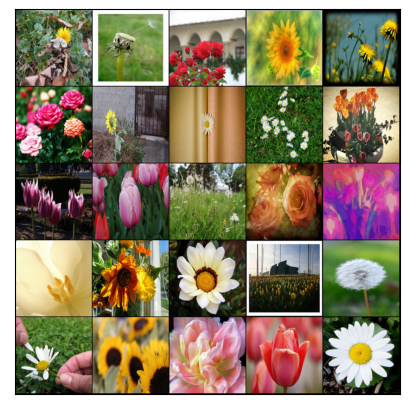

In [71]:
print("For Test Dataset")
show_dataset(test_ds)

100%|██████████| 862/862 [00:03<00:00, 244.65it/s]


Class 4: 213 samples
Class 2: 155 samples
Class 0: 157 samples
Class 1: 202 samples
Class 3: 135 samples


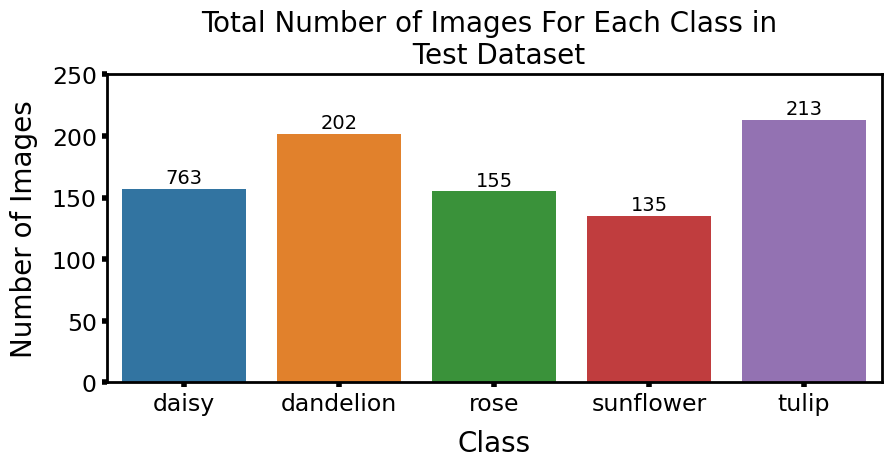

In [72]:
class_counts = defaultdict(int)

for x, y in tqdm(test_ds):
    class_counts[y] += 1

for c, count in class_counts.items():
    print(f"Class {c}: {count} samples")

sorted_dict = dict(sorted(dict(class_counts).items()));sorted_dict

fig, axes = plt.subplots(1, 1, figsize=(10, 4))

ax1 = plt.subplot(1,1,1)
sns.barplot(y = list(sorted_dict.values()), x = [classes[i] for i in list(sorted_dict.keys())],\
           ax = ax1)

ax1.text(0.5, 1.035, "Total Number of Images For Each Class in \n Test Dataset",
    horizontalalignment='center',
    fontsize=20,
    transform = ax1.transAxes);

ax1.set_ylim([0, 250])

for i, bar in enumerate(ax1.containers):
    ax1.bar_label(bar, label_type='edge', fontsize=14, padding=1, labels=[list(number_of_samples_per_class.values())[i]])


ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black') 
ax1.spines['right'].set_color('black')
ax1.spines['right'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_lw(2)

ax1.set_ylabel('Number of Images', fontsize = 20, labelpad = 10, fontweight = 'normal')
ax1.set_xlabel('Class', fontsize = 20, labelpad = 10, fontweight = 'normal')

ax1.tick_params(axis ='both', labelcolor = 'black',labelsize=17, width=4) 

## Creating DataLoaders and Moving them to GPU

In [73]:
train_dl = DataLoader(train_ds_concatenated, batch_size, shuffle=True, num_workers = 2)

In [74]:
val_dl = DataLoader(val_ds, batch_size, shuffle=True, num_workers = 2)
test_dl = DataLoader(test_ds, batch_size, shuffle=True, num_workers = 2)

In [77]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [78]:
device = get_default_device()
device

device(type='cuda')

In [80]:
train_dl = DeviceDataLoader(train_dl, device)

In [81]:
val_dl = DeviceDataLoader(val_dl, device)
test_dl = DeviceDataLoader(test_dl, device)

# Building the Model

In [7]:
class VGG19(nn.Module):
    def __init__(self, num_classes=5):
        super(VGG19, self).__init__()
        self.features = nn.Sequential(
                nn.Conv2d(3, 64, kernel_size=3, padding=1),
                nn.BatchNorm2d(64),
                nn.ReLU(inplace=True),
                nn.Conv2d(64, 64, kernel_size=3, padding=1),
                nn.BatchNorm2d(64),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(kernel_size=2, stride=2),
                nn.Conv2d(64, 128, kernel_size=3, padding=1),
                nn.BatchNorm2d(128),
                nn.ReLU(inplace=True),
                nn.Conv2d(128, 128, kernel_size=3, padding=1),
                nn.BatchNorm2d(128),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(kernel_size=2, stride=2),
                nn.Conv2d(128, 256, kernel_size=3, padding=1),
                nn.BatchNorm2d(256),
                nn.ReLU(inplace=True),
                nn.Conv2d(256, 256, kernel_size=3, padding=1),
                nn.BatchNorm2d(256),
                nn.ReLU(inplace=True),
                nn.Conv2d(256, 256, kernel_size=3, padding=1),
                nn.BatchNorm2d(256),
                nn.ReLU(inplace=True),
                nn.Conv2d(256, 256, kernel_size=3, padding=1),
                nn.BatchNorm2d(256),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(kernel_size=2, stride=2),
                nn.Conv2d(256, 512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(inplace=True),
                nn.Conv2d(512, 512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(inplace=True),
                nn.Conv2d(512, 512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(inplace=True),
                nn.Conv2d(512, 512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(kernel_size=2, stride=2),
                nn.Conv2d(512, 512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(inplace=True),
                nn.Conv2d(512, 512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(inplace=True),
                nn.Conv2d(512, 512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(inplace=True),
                nn.Conv2d(512, 512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(kernel_size=2, stride=2),
            )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
                nn.Linear(512 * 7 * 7, 4096),
                nn.BatchNorm1d(4096),
                nn.ReLU(inplace=True),
                nn.Dropout(),
                nn.Linear(4096, 4096),
                nn.BatchNorm1d(4096),
                nn.ReLU(inplace=True),
                nn.Dropout(),
                nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

model = VGG19()

In [8]:
model

VGG19(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 2

In [10]:
model = model.to('cuda')

In [101]:
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
            Conv2d-4         [-1, 64, 224, 224]          36,928
       BatchNorm2d-5         [-1, 64, 224, 224]             128
              ReLU-6         [-1, 64, 224, 224]               0
         MaxPool2d-7         [-1, 64, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]          73,856
       BatchNorm2d-9        [-1, 128, 112, 112]             256
             ReLU-10        [-1, 128, 112, 112]               0
           Conv2d-11        [-1, 128, 112, 112]         147,584
      BatchNorm2d-12        [-1, 128, 112, 112]             256
             ReLU-13        [-1, 128, 112, 112]               0
        MaxPool2d-14          [-1, 128,

# Model Training

In [88]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, weight_decay=0.001)
criterion = nn.CrossEntropyLoss()

In [89]:
epochs = 30
train_losses = []
train_accs = []
val_losses = []
val_accs = []

for epoch in range(epochs):
    train_loss = 0.0
    train_total = 0
    train_correct = 0
    
    for images, labels in tqdm(train_dl):
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()
        
    train_loss /= len(train_dl)
    train_acc = train_correct / train_total
    train_losses.append(train_loss)
    train_accs.append(train_acc)
    
    val_loss = 0.0
    val_total = 0
    val_correct = 0
    
    with torch.no_grad():
        model.eval()
        for images, labels in val_dl:
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
            
        val_loss /= len(val_dl)
        val_acc = val_correct / val_total
        val_losses.append(val_loss)
        val_accs.append(val_acc)
    
    print(f"Epoch {epoch+1}:")
    print(f"Training Loss: {train_loss:.4f} | Training Accuracy: {train_acc*100:.4f}%")
    print(f"Validation Loss: {val_loss:.4f} | Validation Accuracy: {val_acc*100:.4f}%")
    
    model.train()  

100%|██████████| 162/162 [03:18<00:00,  1.23s/it]


Epoch 1:
Training Loss: 1.4500 | Training Accuracy: 41.3543%
Validation Loss: 1.3593 | Validation Accuracy: 48.4919%


100%|██████████| 162/162 [03:22<00:00,  1.25s/it]


Epoch 2:
Training Loss: 1.3020 | Training Accuracy: 48.4254%
Validation Loss: 1.1974 | Validation Accuracy: 49.6520%


100%|██████████| 162/162 [03:23<00:00,  1.26s/it]


Epoch 3:
Training Loss: 1.2989 | Training Accuracy: 51.9900%
Validation Loss: 1.2455 | Validation Accuracy: 57.7726%


100%|██████████| 162/162 [03:16<00:00,  1.21s/it]


Epoch 4:
Training Loss: 1.2709 | Training Accuracy: 57.0711%
Validation Loss: 1.2885 | Validation Accuracy: 53.0162%


100%|██████████| 162/162 [03:14<00:00,  1.20s/it]


Epoch 5:
Training Loss: 1.1965 | Training Accuracy: 58.4911%
Validation Loss: 1.3769 | Validation Accuracy: 60.4408%


100%|██████████| 162/162 [03:20<00:00,  1.24s/it]


Epoch 6:
Training Loss: 1.2313 | Training Accuracy: 57.7570%
Validation Loss: 1.3022 | Validation Accuracy: 52.9002%


100%|██████████| 162/162 [03:12<00:00,  1.19s/it]


Epoch 7:
Training Loss: 1.2369 | Training Accuracy: 54.7430%
Validation Loss: 1.2882 | Validation Accuracy: 55.1044%


100%|██████████| 162/162 [03:11<00:00,  1.18s/it]


Epoch 8:
Training Loss: 1.1423 | Training Accuracy: 59.5730%
Validation Loss: 1.1976 | Validation Accuracy: 55.8005%


100%|██████████| 162/162 [03:15<00:00,  1.21s/it]


Epoch 9:
Training Loss: 1.0929 | Training Accuracy: 60.5294%
Validation Loss: 1.1318 | Validation Accuracy: 58.8167%


100%|██████████| 162/162 [03:21<00:00,  1.24s/it]


Epoch 10:
Training Loss: 1.0918 | Training Accuracy: 60.9061%
Validation Loss: 1.2057 | Validation Accuracy: 58.8167%


100%|██████████| 162/162 [03:21<00:00,  1.25s/it]


Epoch 11:
Training Loss: 0.9898 | Training Accuracy: 64.0553%
Validation Loss: 1.0015 | Validation Accuracy: 61.9490%


100%|██████████| 162/162 [03:22<00:00,  1.25s/it]


Epoch 12:
Training Loss: 0.9480 | Training Accuracy: 64.4320%
Validation Loss: 0.9609 | Validation Accuracy: 63.9211%


100%|██████████| 162/162 [03:22<00:00,  1.25s/it]


Epoch 13:
Training Loss: 0.9268 | Training Accuracy: 64.7798%
Validation Loss: 1.0260 | Validation Accuracy: 59.3968%


100%|██████████| 162/162 [03:21<00:00,  1.25s/it]


Epoch 14:
Training Loss: 0.8866 | Training Accuracy: 65.0985%
Validation Loss: 0.9430 | Validation Accuracy: 64.2691%


100%|██████████| 162/162 [03:17<00:00,  1.22s/it]


Epoch 15:
Training Loss: 0.8256 | Training Accuracy: 66.8953%
Validation Loss: 0.9305 | Validation Accuracy: 64.1531%


100%|██████████| 162/162 [03:12<00:00,  1.19s/it]


Epoch 16:
Training Loss: 0.8006 | Training Accuracy: 67.3493%
Validation Loss: 0.9662 | Validation Accuracy: 63.6891%


100%|██████████| 162/162 [03:19<00:00,  1.23s/it]


Epoch 17:
Training Loss: 0.7776 | Training Accuracy: 68.6631%
Validation Loss: 0.8253 | Validation Accuracy: 70.3016%


100%|██████████| 162/162 [03:18<00:00,  1.22s/it]


Epoch 18:
Training Loss: 0.7562 | Training Accuracy: 70.0734%
Validation Loss: 0.8214 | Validation Accuracy: 67.9814%


100%|██████████| 162/162 [03:10<00:00,  1.18s/it]


Epoch 19:
Training Loss: 0.7194 | Training Accuracy: 71.8219%
Validation Loss: 0.8672 | Validation Accuracy: 69.1415%


100%|██████████| 162/162 [03:14<00:00,  1.20s/it]


Epoch 20:
Training Loss: 0.6990 | Training Accuracy: 73.5220%
Validation Loss: 0.8128 | Validation Accuracy: 69.8376%


100%|██████████| 162/162 [03:16<00:00,  1.21s/it]


Epoch 21:
Training Loss: 0.6832 | Training Accuracy: 74.6039%
Validation Loss: 0.7685 | Validation Accuracy: 72.8538%


100%|██████████| 162/162 [03:10<00:00,  1.18s/it]


Epoch 22:
Training Loss: 0.6428 | Training Accuracy: 75.6182%
Validation Loss: 0.8007 | Validation Accuracy: 72.2738%


100%|██████████| 162/162 [03:16<00:00,  1.21s/it]


Epoch 23:
Training Loss: 0.6463 | Training Accuracy: 75.4154%
Validation Loss: 0.7690 | Validation Accuracy: 69.1415%


100%|██████████| 162/162 [03:19<00:00,  1.23s/it]


Epoch 24:
Training Loss: 0.6106 | Training Accuracy: 77.2315%
Validation Loss: 0.6823 | Validation Accuracy: 75.1740%


100%|██████████| 162/162 [03:17<00:00,  1.22s/it]


Epoch 25:
Training Loss: 0.6126 | Training Accuracy: 77.1542%
Validation Loss: 0.7117 | Validation Accuracy: 74.2459%


100%|██████████| 162/162 [03:08<00:00,  1.17s/it]


Epoch 26:
Training Loss: 0.5858 | Training Accuracy: 78.2264%
Validation Loss: 0.6631 | Validation Accuracy: 76.1021%


100%|██████████| 162/162 [03:13<00:00,  1.20s/it]


Epoch 27:
Training Loss: 0.5755 | Training Accuracy: 78.9026%
Validation Loss: 0.6623 | Validation Accuracy: 75.7541%


100%|██████████| 162/162 [03:18<00:00,  1.22s/it]


Epoch 28:
Training Loss: 0.5752 | Training Accuracy: 79.3470%
Validation Loss: 0.7221 | Validation Accuracy: 74.0139%


100%|██████████| 162/162 [03:11<00:00,  1.18s/it]


Epoch 29:
Training Loss: 0.5546 | Training Accuracy: 79.9652%
Validation Loss: 0.7244 | Validation Accuracy: 73.6659%


100%|██████████| 162/162 [03:10<00:00,  1.17s/it]


Epoch 30:
Training Loss: 0.5180 | Training Accuracy: 81.1148%
Validation Loss: 0.7289 | Validation Accuracy: 75.8701%


In [91]:
training_stats = pd.DataFrame({"Training_Accuracy": train_accs,
                               "Training_Loss": train_losses,
                               "Val_Loss": val_losses,
                               "Val_Accuracy": val_accs})

training_stats.to_csv("VGG19_Training Statistics.csv", index = True)

In [38]:
training_stats = pd.read_csv('VGG19_Training Statistics.csv')
training_stats = training_stats[['Training_Accuracy',	'Training_Loss', 'Val_Loss', 'Val_Accuracy']]

In [40]:
training_stats.head()

,Training_Accuracy,Training_Loss,Val_Loss,Val_Accuracy
0,0.413543,1.450039,1.359274,0.484919
1,0.484254,1.301991,1.197390,0.496520
2,0.519900,1.298880,1.245546,0.577726
3,0.570711,1.270896,1.288489,0.530162
4,0.584911,1.196527,1.376896,0.604408


Text(0.5, 0.95, 'VGG19 Performance on Training and Validation Datasets')

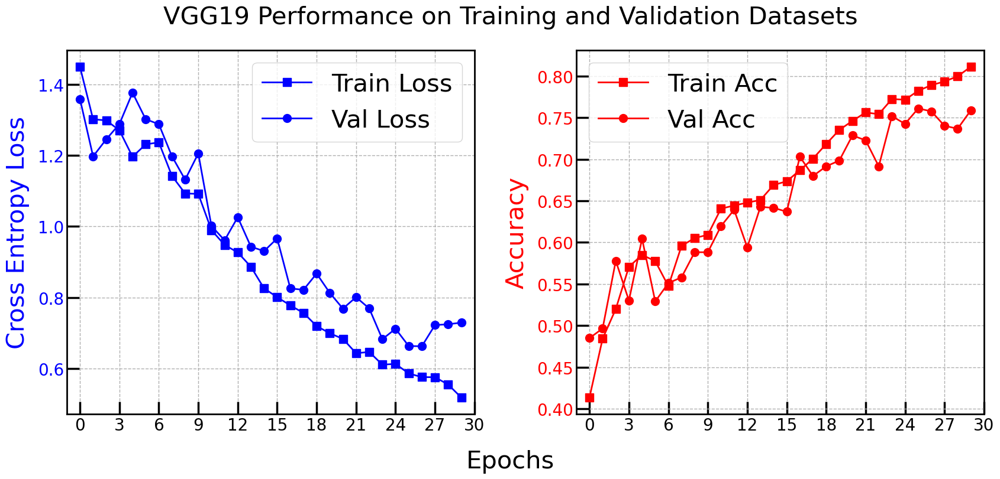

In [92]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

ax1 = plt.subplot(1,2, 1)

plot_1 = ax1.plot(range(0, 30), training_stats['Training_Loss'], color = 'blue', label = 'Train Loss',\
             marker = 's', linewidth=2.0, markersize = 10)

plot_2 = ax1.plot(range(0, 30), training_stats['Val_Loss'], color = 'blue', label = 'Val Loss',\
             marker = 'o', linewidth=2.0, markersize = 10)

ax1.tick_params(axis ='y', labelcolor = 'blue',labelsize=20, width=3) 
ax1.tick_params(axis ='x', labelcolor = 'black',labelsize=20, width=3)
ax1.legend(fontsize = 30)
plt.xticks(range(0,33,3))
ax1.set_xlim([-1, 30])
ax1.set_ylabel("Cross Entropy Loss", fontsize = 30, labelpad = 10, color = 'blue')


ax1a = plt.subplot(1,2, 2)
plot_11 = ax1a.plot(range(0, 30), training_stats['Training_Accuracy'], color = 'red', label = 'Train Acc',\
             marker = 's', linewidth=2.0, markersize = 10)

plot_22 = ax1a.plot(range(0, 30), training_stats['Val_Accuracy'], color = 'red', label = 'Val Acc',\
             marker = 'o', linewidth=2.0, markersize = 10)
ax1a.legend(fontsize = 30)
plt.xticks(range(0,33,3))
ax1a.set_xlim([-1, 30])
ax1a.tick_params(axis ='y', labelcolor = 'red',labelsize=20, width=3) 
ax1a.tick_params(axis ='x', labelcolor = 'black',labelsize=20, width=3)
ax1a.set_ylabel("Accuracy", fontsize = 30, labelpad = 10, color = 'red')


ax1.tick_params(which='both', width=2.5)
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=5)
ax1.tick_params(which = 'both', direction = 'in')

ax1a.tick_params(which='both', width=2.5)
ax1a.tick_params(which='major', length=15)
ax1a.tick_params(which='minor', length=5)
ax1a.tick_params(which = 'both', direction = 'in') 

ax1a.spines['bottom'].set_color('black')
ax1a.spines['top'].set_color('black') 
ax1a.spines['right'].set_color('black')
ax1a.spines['right'].set_linewidth(2)
ax1a.spines['top'].set_linewidth(2)
ax1a.spines['bottom'].set_linewidth(2)
ax1a.spines['left'].set_color('black')
ax1a.spines['left'].set_lw(2)

ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black') 
ax1.spines['right'].set_color('black')
ax1.spines['right'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_lw(2)


ax1.grid(True, which = 'major', alpha = 1, linestyle='--', linewidth = 1)
ax1a.grid(True, which = 'major', alpha = 1, linestyle='--', linewidth = 1)


plt.subplots_adjust(wspace=0.25,hspace=0.)
fig.text(0.5, 0.01, 'Epochs', ha='center', va='center', fontsize = 30)

fig.text(0.5, 0.95, 'VGG19 Performance on Training and Validation Datasets', ha='center', va='center', fontsize = 30)

# Evaluating Model Performance on Test Data

In [89]:
model.load_state_dict(torch.load('VGG19_BN_30_epochs.pth'))
model.eval()

VGG19(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 2

In [365]:
def make_predictions_on_dataloaders(trained_model, dataloader):
    target = []
    probabilities = []
    predictions = []
    pred_probs_for_all_class = []
    
    with torch.no_grad():
        trained_model.eval()
        for images, labels in tqdm(test_dl):
            yb = trained_model(images)
            out = nn.Softmax(dim = 1)(yb)
            out = out.cpu()
            probs, preds  = torch.max(out, dim=1)
            preds = np.array(preds.cpu().detach())
            probs = probs.cpu().detach().numpy()
            labels = labels.cpu().detach().numpy()
            out = out.detach().numpy()


            target.append(labels)
            probabilities.append(probs)
            predictions.append(preds)
            pred_probs_for_all_class.append(out)
        
    return target, probabilities, predictions, pred_probs_for_all_class

In [93]:
target, probabilities, predictions, pred_probs_for_all_class = make_predictions_on_dataloaders(model, test_dl)

100%|██████████| 14/14 [00:07<00:00,  1.77it/s]


In [94]:
def flatten(input_arr):
    output = []
    for i in input_arr:
        for j in i:
            output.append(j)
    return output

In [95]:
predictions = flatten([list(i) for i in predictions])
target = flatten([list(i) for i in target])
probabilities = flatten([list(i) for i in probabilities])
pred_probs_for_all_class = np.array(flatten(pred_probs_for_all_class))

In [97]:
print("The testing accuracy is: {}".format(accuracy_score(target, predictions)*100))

The testing accuracy is: 77.03016241299304


In [98]:
print("Precision (Test): ", precision_score(target, predictions, average = 'weighted'))
print("Recall (Test): ", recall_score(target, predictions, average = 'weighted'))
print("F1 (Test): ", f1_score(target, predictions, average = 'weighted'))

Precision (Test):  0.7792436524605408
Recall (Test):  0.7703016241299304
F1 (Test):  0.7726826775646839


In [99]:
print("Classification Report")
print(classification_report(target, predictions))

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.76      0.82       157
           1       0.81      0.83      0.82       202
           2       0.62      0.72      0.67       155
           3       0.85      0.76      0.80       135
           4       0.73      0.77      0.75       213

    accuracy                           0.77       862
   macro avg       0.78      0.77      0.77       862
weighted avg       0.78      0.77      0.77       862



In [100]:
cf_matrix = confusion_matrix(target, predictions)
dataframe = pd.DataFrame(cf_matrix, index = classes, columns = classes)

In [101]:
dataframe

,daisy,dandelion,rose,sunflower,tulip
daisy,120,12,18,4,3
dandelion,7,167,9,6,13
rose,3,1,111,4,36
sunflower,3,20,2,102,8
tulip,1,6,38,4,164


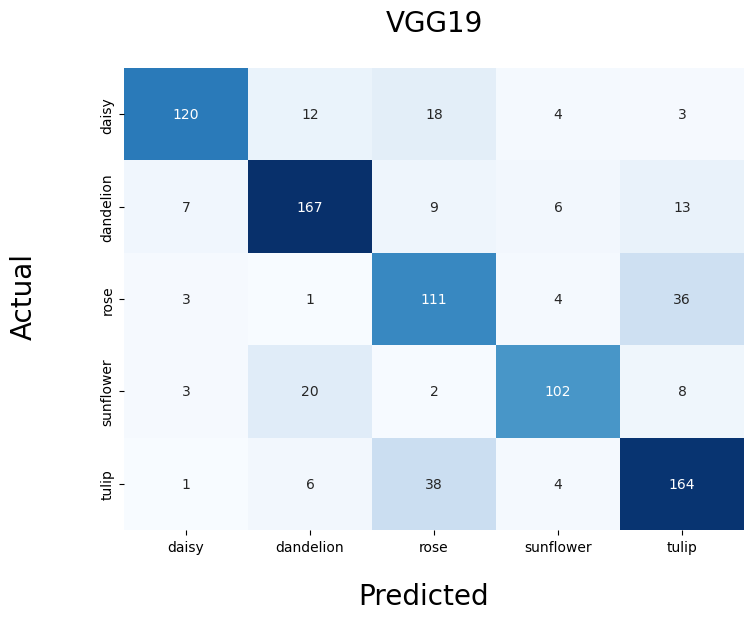

In [102]:
fig, axes = plt.subplots(1, 1, figsize=(8, 6))

ax1 = plt.subplot(1, 1, 1)

sns.heatmap(dataframe, cmap="Blues", annot = True, fmt="d", cbar =False)
fig.text(0.5, 0.00, 'Predicted', ha='center', va='center', fontsize = 20)
fig.text(0.0, 0.5, 'Actual', ha='center', va='center', rotation='vertical', fontsize = 20)
ax1.text(0.5, 1.08, 'VGG19',
    horizontalalignment='center',
    fontsize=20,
    transform = ax1.transAxes);

In [103]:
fprs = {}
tprs = {}
thresholds ={}

for i in range(5):    
    fprs[i], tprs[i], thresholds[i] = roc_curve(target, pred_probs_for_all_class[:,i], pos_label=i)

In [104]:
auc_score_ovr = roc_auc_score(target, pred_probs_for_all_class, multi_class='ovr', average = 'weighted')
print("AUC SCORE (Test Set): {}".format(auc_score_ovr))

AUC SCORE (Test Set): 0.9443184074462758


In [105]:
one_vs_rest_auc = roc_auc_score(target, pred_probs_for_all_class, multi_class='ovr', average = None)

Text(0.5, 0.91, 'VGG19')

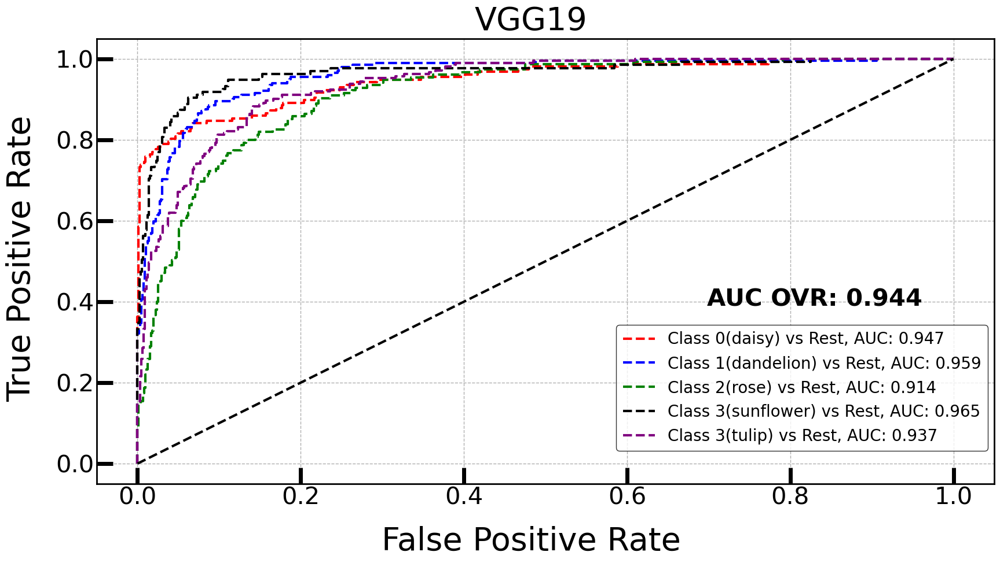

In [108]:
fig, axes = plt.subplots(1, 1, figsize=(20, 10))

ax1 = plt.subplot(1, 1, 1)

plt.plot(fprs[0], tprs[0], linestyle='--',color='red', label='Class 0(daisy) vs Rest, AUC: '+ \
        str(round(one_vs_rest_auc[0], 3)), linewidth = 3)
plt.plot(fprs[1], tprs[1], linestyle='--',color='blue', label='Class 1(dandelion) vs Rest, AUC: '+ \
        str(round(one_vs_rest_auc[1], 3)), linewidth = 3)
plt.plot(fprs[2], tprs[2], linestyle='--',color='green', label='Class 2(rose) vs Rest, AUC: '+ \
        str(round(one_vs_rest_auc[2], 3)), linewidth = 3)
plt.plot(fprs[3], tprs[3], linestyle='--',color='black', label='Class 3(sunflower) vs Rest, AUC: '+ \
        str(round(one_vs_rest_auc[3], 3)), linewidth = 3)
plt.plot(fprs[4], tprs[4], linestyle='--',color='purple', label='Class 3(tulip) vs Rest, AUC: '+ \
        str(round(one_vs_rest_auc[4], 3)), linewidth = 3)


plt.plot([0, 1], [0, 1], color="black", linewidth = 3, linestyle = '--')


ax1.tick_params(axis ='y', labelcolor = 'black',labelsize=30, width=3) 
ax1.tick_params(axis ='x', labelcolor = 'black',labelsize=30, width=3) 



ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black') 
ax1.spines['right'].set_color('black')
ax1.spines['right'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_lw(2)



ax1.tick_params(which='both', width=5)
ax1.tick_params(which='major', length=20)
ax1.tick_params(which='minor', length=5)
ax1.tick_params(which = 'both', direction = 'in')


ax1.grid(True, which = 'major', alpha = 1, linestyle='--', linewidth = 1)
lines_labels = [[ax.get_legend_handles_labels() for ax in fig.axes][0]]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
leg = ax1.legend(lines, labels, loc="upper left", bbox_to_anchor=(0.57, 0.375), fontsize = 20, ncol = 1,markerscale = 10)
leg.get_frame().set_edgecolor('black')


ax1.text(0.8, 0.4, 'AUC OVR: '+ str(round(auc_score_ovr, 3)),
    horizontalalignment='center',
    fontsize=30,fontweight = 'bold',
    transform = ax1.transAxes);


plt.subplots_adjust(wspace=0.2,hspace=0.3)
fig.text(0.5, 0.01, 'False Positive Rate', ha='center', va='center', fontsize = 40)
fig.text(0.06, 0.5, 'True Positive Rate', ha='center', va='center', rotation='vertical', fontsize = 40, color = 'black')
fig.text(0.5, 0.91, 'VGG19', ha='center', va='center', fontsize = 40)

# Transfer Learning

In [331]:
vgg19_pretrained = models.vgg19(pretrained=True)

## Freeze Early layers

## Inserting a Custom Classififer

In [334]:
vgg19_pretrained.classifier

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)

In [335]:
vgg19_pretrained.classifier[6] 

Linear(in_features=4096, out_features=1000, bias=True)

In [336]:
vgg19_pretrained.classifier[6] = nn.Sequential(
                    nn.Linear(4096, 2048), 
                    nn.BatchNorm1d(2048),
                    nn.LeakyReLU(negative_slope=0.01),
                    nn.Dropout(0.25),
                    nn.Linear(2048, 1024),
                    nn.BatchNorm1d(1024),
                    nn.LeakyReLU(negative_slope=0.01),
                    nn.Dropout(0.25),
                    nn.Linear(1024, 5))


In [337]:
vgg19_pretrained.classifier[6] 

Sequential(
  (0): Linear(in_features=4096, out_features=2048, bias=True)
  (1): BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): LeakyReLU(negative_slope=0.01)
  (3): Dropout(p=0.25, inplace=False)
  (4): Linear(in_features=2048, out_features=1024, bias=True)
  (5): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (6): LeakyReLU(negative_slope=0.01)
  (7): Dropout(p=0.25, inplace=False)
  (8): Linear(in_features=1024, out_features=5, bias=True)
)

In [338]:
vgg19_pretrained.classifier

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Sequential(
    (0): Linear(in_features=4096, out_features=2048, bias=True)
    (1): BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Dropout(p=0.25, inplace=False)
    (4): Linear(in_features=2048, out_features=1024, bias=True)
    (5): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.01)
    (7): Dropout(p=0.25, inplace=False)
    (8): Linear(in_features=1024, out_features=5, bias=True)
  )
)

In [339]:
vgg19_pretrained

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [340]:
vgg19_pretrained = vgg19_pretrained.to('cuda')

In [341]:
summary(vgg19_pretrained, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

In [342]:
for param in vgg19_pretrained.features.parameters():
    param.requires_grad = False

In [343]:
num_conv_layers = sum(1 for layer in vgg19_pretrained.features if isinstance(layer, nn.Conv2d))
print("Number of convolutional layers in VGG19:", num_conv_layers)

Number of convolutional layers in VGG19: 16


## Training the pretrained model by freezing weights

In [352]:
vgg19_pretrained.classifier[6]

Sequential(
  (0): Linear(in_features=4096, out_features=2048, bias=True)
  (1): BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): LeakyReLU(negative_slope=0.01)
  (3): Dropout(p=0.25, inplace=False)
  (4): Linear(in_features=2048, out_features=1024, bias=True)
  (5): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (6): LeakyReLU(negative_slope=0.01)
  (7): Dropout(p=0.25, inplace=False)
  (8): Linear(in_features=1024, out_features=5, bias=True)
)

In [355]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(vgg19_pretrained.classifier[6].parameters(), lr=0.001)

In [356]:
epochs = 10
train_losses = []
train_accs = []
val_losses = []
val_accs = []

for epoch in range(epochs):
    train_loss = 0.0
    train_total = 0
    train_correct = 0
    
    for images, labels in tqdm(train_dl):
        optimizer.zero_grad()
        outputs = vgg19_pretrained(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()
        
    train_loss /= len(train_dl)
    train_acc = train_correct / train_total
    train_losses.append(train_loss)
    train_accs.append(train_acc)
    
    val_loss = 0.0
    val_total = 0
    val_correct = 0
    
    with torch.no_grad():
        vgg19_pretrained.eval()  
        for images, labels in val_dl:
            outputs = vgg19_pretrained(images)
            loss = criterion(outputs, labels)
            
            val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
            
        val_loss /= len(val_dl)
        val_acc = val_correct / val_total
        val_losses.append(val_loss)
        val_accs.append(val_acc)
    
    print(f"Epoch {epoch+1}:")
    print(f"Training Loss: {train_loss:.4f} | Training Accuracy: {train_acc*100:.4f}%")
    print(f"Validation Loss: {val_loss:.4f} | Validation Accuracy: {val_acc*100:.4f}%")
    
    vgg19_pretrained.train()  

100%|██████████| 162/162 [00:58<00:00,  2.75it/s]


Epoch 1:
Training Loss: 0.5529 | Training Accuracy: 79.2890%
Validation Loss: 0.3834 | Validation Accuracy: 86.3109%


100%|██████████| 162/162 [00:59<00:00,  2.73it/s]


Epoch 2:
Training Loss: 0.4131 | Training Accuracy: 84.6696%
Validation Loss: 0.3820 | Validation Accuracy: 86.4269%


100%|██████████| 162/162 [00:56<00:00,  2.87it/s]


Epoch 3:
Training Loss: 0.3713 | Training Accuracy: 85.8192%
Validation Loss: 0.3570 | Validation Accuracy: 87.8190%


100%|██████████| 162/162 [00:56<00:00,  2.88it/s]


Epoch 4:
Training Loss: 0.3295 | Training Accuracy: 87.8671%
Validation Loss: 0.3911 | Validation Accuracy: 87.0070%


100%|██████████| 162/162 [00:56<00:00,  2.87it/s]


Epoch 5:
Training Loss: 0.3094 | Training Accuracy: 88.2631%
Validation Loss: 0.4200 | Validation Accuracy: 87.8190%


100%|██████████| 162/162 [00:56<00:00,  2.88it/s]


Epoch 6:
Training Loss: 0.2803 | Training Accuracy: 89.4223%
Validation Loss: 0.4036 | Validation Accuracy: 86.5429%


100%|██████████| 162/162 [00:56<00:00,  2.87it/s]


Epoch 7:
Training Loss: 0.2605 | Training Accuracy: 90.1565%
Validation Loss: 0.3803 | Validation Accuracy: 88.8631%


100%|██████████| 162/162 [00:56<00:00,  2.87it/s]


Epoch 8:
Training Loss: 0.2459 | Training Accuracy: 90.6491%
Validation Loss: 0.4121 | Validation Accuracy: 87.7030%


100%|██████████| 162/162 [00:56<00:00,  2.86it/s]


Epoch 9:
Training Loss: 0.2291 | Training Accuracy: 91.1804%
Validation Loss: 0.3879 | Validation Accuracy: 88.9791%


100%|██████████| 162/162 [00:58<00:00,  2.75it/s]


Epoch 10:
Training Loss: 0.2257 | Training Accuracy: 91.5379%
Validation Loss: 0.4259 | Validation Accuracy: 88.0510%


In [357]:
training_stats = pd.DataFrame({"Training_Accuracy": train_accs,
                               "Training_Loss": train_losses,
                               "Val_Loss": val_losses,
                               "Val_Accuracy": val_accs})

In [358]:
torch.save(vgg19_pretrained.state_dict(), 'VGG19_Pretrained_30_epochs.pth')

Text(0.5, 0.95, 'VGG19 (Pretrained) Performance on Training and Validation Datasets')

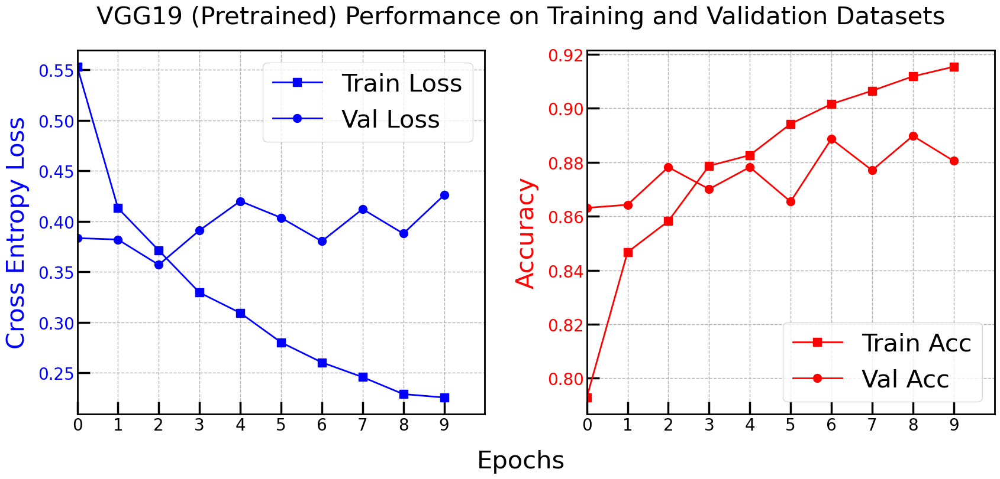

In [359]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

ax1 = plt.subplot(1,2, 1)

plot_1 = ax1.plot(range(0, 10), training_stats['Training_Loss'], color = 'blue', label = 'Train Loss',\
             marker = 's', linewidth=2.0, markersize = 10)

plot_2 = ax1.plot(range(0, 10), training_stats['Val_Loss'], color = 'blue', label = 'Val Loss',\
             marker = 'o', linewidth=2.0, markersize = 10)

ax1.tick_params(axis ='y', labelcolor = 'blue',labelsize=20, width=3) 
ax1.tick_params(axis ='x', labelcolor = 'black',labelsize=20, width=3)
ax1.legend(fontsize = 30, loc = 'best')
plt.xticks(range(0,10,1))
ax1.set_xlim([0, 10])
ax1.set_ylabel("Cross Entropy Loss", fontsize = 30, labelpad = 10, color = 'blue')


ax1a = plt.subplot(1,2, 2)
plot_11 = ax1a.plot(range(0, 10), training_stats['Training_Accuracy'], color = 'red', label = 'Train Acc',\
             marker = 's', linewidth=2.0, markersize = 10)

plot_22 = ax1a.plot(range(0, 10), training_stats['Val_Accuracy'], color = 'red', label = 'Val Acc',\
             marker = 'o', linewidth=2.0, markersize = 10)
ax1a.legend(fontsize = 30, loc = 'best')
plt.xticks(range(0,10,1))
ax1a.set_xlim([0, 10])
ax1a.tick_params(axis ='y', labelcolor = 'red',labelsize=20, width=3) 
ax1a.tick_params(axis ='x', labelcolor = 'black',labelsize=20, width=3)
ax1a.set_ylabel("Accuracy", fontsize = 30, labelpad = 10, color = 'red')


ax1.tick_params(which='both', width=2.5)
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=5)
ax1.tick_params(which = 'both', direction = 'in')

ax1a.tick_params(which='both', width=2.5)
ax1a.tick_params(which='major', length=15)
ax1a.tick_params(which='minor', length=5)
ax1a.tick_params(which = 'both', direction = 'in') 

ax1a.spines['bottom'].set_color('black')
ax1a.spines['top'].set_color('black') 
ax1a.spines['right'].set_color('black')
ax1a.spines['right'].set_linewidth(2)
ax1a.spines['top'].set_linewidth(2)
ax1a.spines['bottom'].set_linewidth(2)
ax1a.spines['left'].set_color('black')
ax1a.spines['left'].set_lw(2)

ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black') 
ax1.spines['right'].set_color('black')
ax1.spines['right'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_lw(2)


ax1.grid(True, which = 'major', alpha = 1, linestyle='--', linewidth = 1)
ax1a.grid(True, which = 'major', alpha = 1, linestyle='--', linewidth = 1)


plt.subplots_adjust(wspace=0.25,hspace=0.)
fig.text(0.5, 0.01, 'Epochs', ha='center', va='center', fontsize = 30)

fig.text(0.5, 0.95, 'VGG19 (Pretrained) Performance on Training and Validation Datasets', ha='center', va='center', fontsize = 30)

## Evaluating Pretrained Model's performance on Test Data

In [366]:
target, probabilities, predictions, pred_probs_for_all_class = make_predictions_on_dataloaders(vgg19_pretrained, test_dl)

100%|██████████| 14/14 [00:05<00:00,  2.58it/s]


In [367]:
predictions = flatten([list(i) for i in predictions])
target = flatten([list(i) for i in target])
probabilities = flatten([list(i) for i in probabilities])
pred_probs_for_all_class = np.array(flatten(pred_probs_for_all_class))

In [368]:
print("The testing accuracy using PRETRAINED MODEL is: {}".format(accuracy_score(target, predictions)*100))

The testing accuracy using PRETRAINED MODEL is: 88.8631090487239


In [369]:
print("Precision (Test): ", precision_score(target, predictions, average = 'weighted'))
print("Recall (Test): ", recall_score(target, predictions, average = 'weighted'))
print("F1 (Test): ", f1_score(target, predictions, average = 'weighted'))

Precision (Test):  0.8905921241016348
Recall (Test):  0.888631090487239
F1 (Test):  0.8890252526279564


In [370]:
print("Classification Report")
print(classification_report(target, predictions))

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       157
           1       0.95      0.89      0.92       202
           2       0.84      0.86      0.85       155
           3       0.84      0.92      0.88       135
           4       0.89      0.87      0.88       213

    accuracy                           0.89       862
   macro avg       0.89      0.89      0.89       862
weighted avg       0.89      0.89      0.89       862



In [371]:
cf_matrix = confusion_matrix(target, predictions)
dataframe = pd.DataFrame(cf_matrix, index = classes, columns = classes)

In [372]:
dataframe

,daisy,dandelion,rose,sunflower,tulip
daisy,142,5,2,6,2
dandelion,7,180,2,10,3
rose,3,0,134,4,14
sunflower,4,2,2,124,3
tulip,2,2,19,4,186


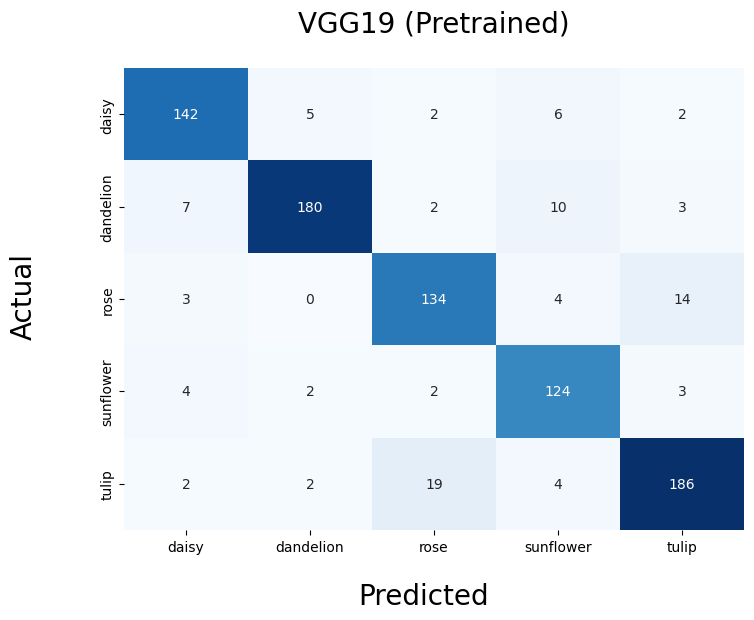

In [373]:
fig, axes = plt.subplots(1, 1, figsize=(8, 6))

ax1 = plt.subplot(1, 1, 1)

sns.heatmap(dataframe, cmap="Blues", annot = True, fmt="d", cbar =False)
fig.text(0.5, 0.00, 'Predicted', ha='center', va='center', fontsize = 20)
fig.text(0.0, 0.5, 'Actual', ha='center', va='center', rotation='vertical', fontsize = 20)
ax1.text(0.5, 1.08, 'VGG19 (Pretrained)',
    horizontalalignment='center',
    fontsize=20,
    transform = ax1.transAxes);

In [374]:
fprs = {}
tprs = {}
thresholds ={}

for i in range(5):    
    fprs[i], tprs[i], thresholds[i] = roc_curve(target, pred_probs_for_all_class[:,i], pos_label=i)

In [375]:
auc_score_ovr = roc_auc_score(target, pred_probs_for_all_class, multi_class='ovr', average = 'weighted')
print("AUC SCORE (Test Set): {}".format(auc_score_ovr))

AUC SCORE (Test Set): 0.9883210264136475


In [376]:
one_vs_rest_auc = roc_auc_score(target, pred_probs_for_all_class, multi_class='ovr', average = None)

Text(0.5, 0.91, 'VGG19 (Pretrained)')

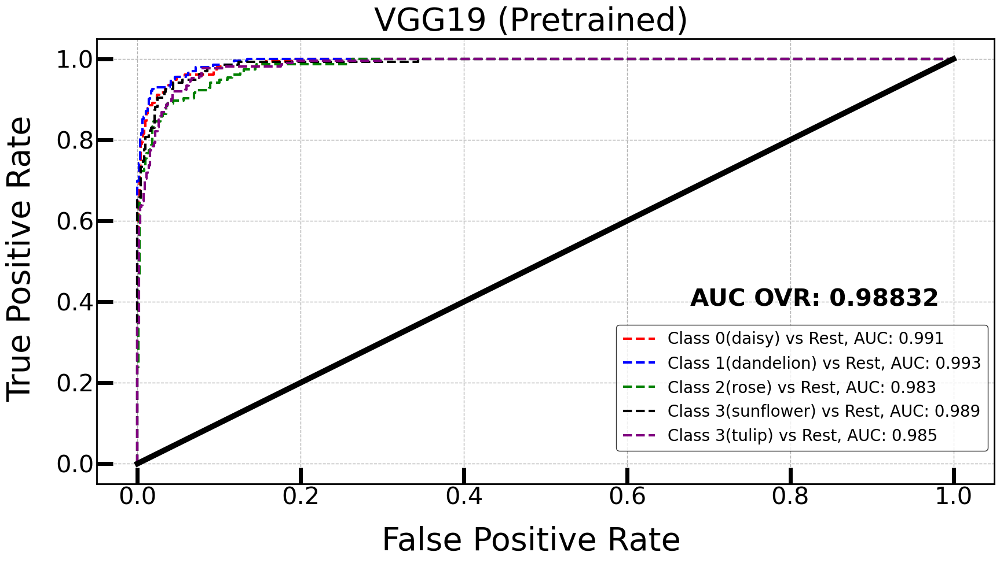

In [379]:
fig, axes = plt.subplots(1, 1, figsize=(20, 10))

ax1 = plt.subplot(1, 1, 1)

plt.plot(fprs[0], tprs[0], linestyle='--',color='red', label='Class 0(daisy) vs Rest, AUC: '+ \
        str(round(one_vs_rest_auc[0], 3)), linewidth = 3)
plt.plot(fprs[1], tprs[1], linestyle='--',color='blue', label='Class 1(dandelion) vs Rest, AUC: '+ \
        str(round(one_vs_rest_auc[1], 3)), linewidth = 3)
plt.plot(fprs[2], tprs[2], linestyle='--',color='green', label='Class 2(rose) vs Rest, AUC: '+ \
        str(round(one_vs_rest_auc[2], 3)), linewidth = 3)
plt.plot(fprs[3], tprs[3], linestyle='--',color='black', label='Class 3(sunflower) vs Rest, AUC: '+ \
        str(round(one_vs_rest_auc[3], 3)), linewidth = 3)
plt.plot(fprs[4], tprs[4], linestyle='--',color='purple', label='Class 3(tulip) vs Rest, AUC: '+ \
        str(round(one_vs_rest_auc[4], 3)), linewidth = 3)


plt.plot([0, 1], [0, 1], color="black", linewidth = 7)


ax1.tick_params(axis ='y', labelcolor = 'black',labelsize=30, width=3) 
ax1.tick_params(axis ='x', labelcolor = 'black',labelsize=30, width=3) 


ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black') 
ax1.spines['right'].set_color('black')
ax1.spines['right'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_lw(2)

ax1.tick_params(which='both', width=5)
ax1.tick_params(which='major', length=20)
ax1.tick_params(which='minor', length=5)
ax1.tick_params(which = 'both', direction = 'in')


ax1.grid(True, which = 'major', alpha = 1, linestyle='--', linewidth = 1)
lines_labels = [[ax.get_legend_handles_labels() for ax in fig.axes][0]]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
leg = ax1.legend(lines, labels, loc="upper left", bbox_to_anchor=(0.57, 0.375), fontsize = 20, ncol = 1,markerscale = 10)
leg.get_frame().set_edgecolor('black')


ax1.text(0.8, 0.4, 'AUC OVR: '+ str(round(auc_score_ovr, 5)),
    horizontalalignment='center',
    fontsize=30,fontweight = 'bold',
    transform = ax1.transAxes);


plt.subplots_adjust(wspace=0.2,hspace=0.3)
fig.text(0.5, 0.01, 'False Positive Rate', ha='center', va='center', fontsize = 40)
fig.text(0.06, 0.5, 'True Positive Rate', ha='center', va='center', rotation='vertical', fontsize = 40, color = 'black')
fig.text(0.5, 0.91, 'VGG19 (Pretrained)', ha='center', va='center', fontsize = 40)

# Making Individual Predictions

In [14]:
VGG_Custom = VGG19()
vgg19_pretrained = models.vgg19(pretrained=False)
vgg19_pretrained.classifier[6] = nn.Sequential(
                    nn.Linear(4096, 2048), 
                    nn.BatchNorm1d(2048),
                    nn.LeakyReLU(negative_slope=0.01),
                    nn.Dropout(0.25),
                    nn.Linear(2048, 1024),
                    nn.BatchNorm1d(1024),
                    nn.LeakyReLU(negative_slope=0.01),
                    nn.Dropout(0.25),
                    nn.Linear(1024, 5))

In [15]:
VGG_Custom.load_state_dict(torch.load('VGG19_BN_30_epochs.pth'))
VGG_Custom.eval()

VGG19(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 2

In [16]:
vgg19_pretrained.load_state_dict(torch.load('VGG19_Pretrained_30_epochs.pth'))
vgg19_pretrained.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [17]:
VGG_Custom = VGG_Custom.to('cuda')
vgg19_pretrained = vgg19_pretrained.to('cuda')

In [39]:
image_size = (224, 224)
mean = [0.4588, 0.4198, 0.3006]
std = [0.2941, 0.2635, 0.2864]

transformations_to_perform = transform=tt.Compose([
                                tt.Resize(image_size),
                                tt.ToTensor(),
                                tt.Normalize(mean, std)])

In [99]:
def make_individual_predictions(img_path, device, model_local):
    img = transformations_to_perform(Image.open(img_path))
    img = img.reshape(1, 3, 224, 224)
    img = img.to(device)
    output = model_local(img)
    output_softmax = nn.Softmax(dim = 1)(output).cpu().detach().numpy()
    pred = np.argmax(output_softmax)
    prob = output_softmax[0][pred]
    
    return pred, prob, dict(zip(n_classes, list(output_softmax[0])))

### Individual Prediction 1

<b> PREDICTIONS MADE BY THE VGG19 TRAINED FROM SCRATCH

Predicted Class: dandelion, with Predicted Probability of: 0.9578337073326111.
Predicted Probabilities for Each Class: 
 {'daisy': 0.018404493, 'dandelion': 0.9578337, 'rose': 0.0033045793, 'sunflower': 0.0032980843, 'tulip': 0.017159138}


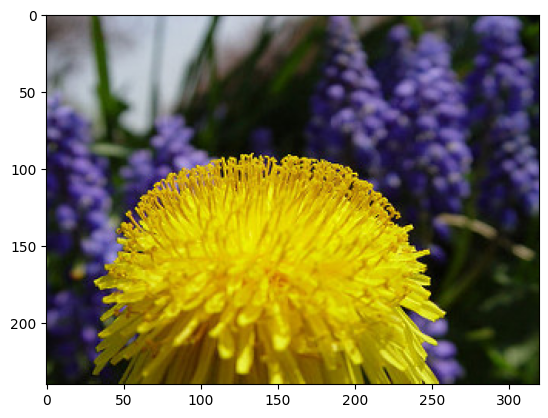

In [111]:
img_path = r"Flower Classification\Test\16159487_3a6615a565_n.jpg"

pred, prob, prob_for_all_class = make_individual_predictions(img_path, device, VGG_Custom)
print("Predicted Class: {}, with Predicted Probability of: {}.".format(n_classes[pred], prob))
print("Predicted Probabilities for Each Class: \n",prob_for_all_class)
ax = plt.subplot()
ax.imshow(Image.open(img_path))
plt.show()

<b> PREDICTIONS MADE BY PRETRAINED VGG19 

Predicted Class: dandelion, with Predicted Probability of: 0.9943735599517822.
Predicted Probabilities for Each Class: 
 {'daisy': 0.004123726, 'dandelion': 0.99437356, 'rose': 1.5118842e-07, 'sunflower': 0.0013923338, 'tulip': 0.00011019283}


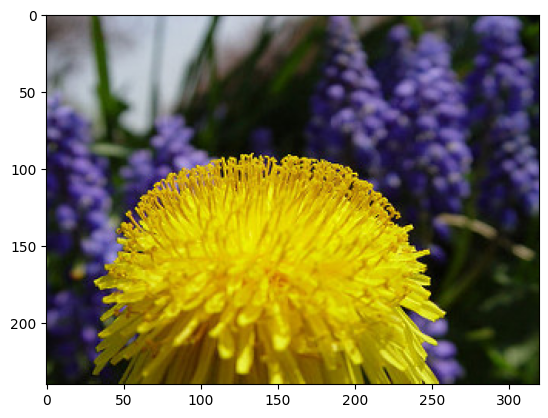

In [112]:
img_path = r"Flower Classification\Test\16159487_3a6615a565_n.jpg"

pred, prob, prob_for_all_class = make_individual_predictions(img_path, device, vgg19_pretrained)
print("Predicted Class: {}, with Predicted Probability of: {}.".format(n_classes[pred], prob))
print("Predicted Probabilities for Each Class: \n",prob_for_all_class)
ax = plt.subplot()
ax.imshow(Image.open(img_path))
plt.show()

### Individual Prediction 2

<b> PREDICTIONS MADE BY THE VGG19 TRAINED FROM SCRATCH

Predicted Class: sunflower, with Predicted Probability of: 0.7464743852615356.
Predicted Probabilities for Each Class: 
 {'daisy': 0.013468694, 'dandelion': 0.23312251, 'rose': 0.0012241956, 'sunflower': 0.7464744, 'tulip': 0.00571024}


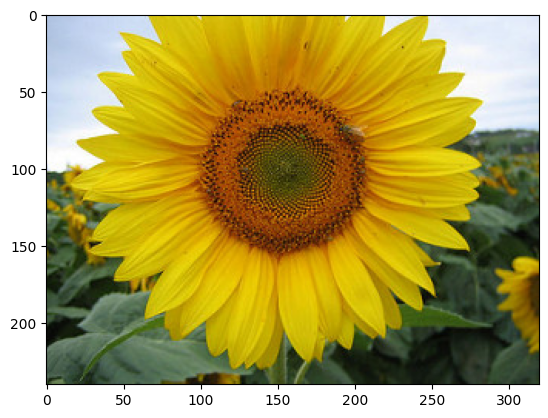

In [113]:
img_path = r"Flower Classification\Test\40410814_fba3837226_n.jpg"

pred, prob, prob_for_all_class = make_individual_predictions(img_path, device, VGG_Custom)
print("Predicted Class: {}, with Predicted Probability of: {}.".format(n_classes[pred], prob))
print("Predicted Probabilities for Each Class: \n",prob_for_all_class)
ax = plt.subplot()
ax.imshow(Image.open(img_path))
plt.show()

<b> PREDICTIONS MADE BY PRETRAINED VGG19 

Predicted Class: sunflower, with Predicted Probability of: 0.9997443556785583.
Predicted Probabilities for Each Class: 
 {'daisy': 0.000253121, 'dandelion': 2.4485105e-06, 'rose': 1.7555228e-08, 'sunflower': 0.99974436, 'tulip': 1.5682708e-08}


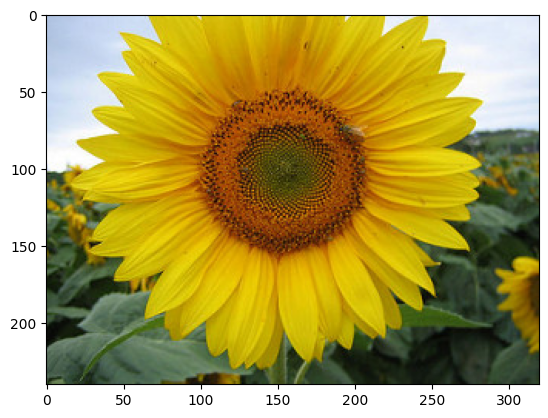

In [114]:
img_path = r"Flower Classification\Test\40410814_fba3837226_n.jpg"

pred, prob, prob_for_all_class = make_individual_predictions(img_path, device, vgg19_pretrained)
print("Predicted Class: {}, with Predicted Probability of: {}.".format(n_classes[pred], prob))
print("Predicted Probabilities for Each Class: \n",prob_for_all_class)
ax = plt.subplot()
ax.imshow(Image.open(img_path))
plt.show()

### Individual Prediction 3

<b> PREDICTIONS MADE BY THE VGG19 TRAINED FROM SCRATCH

Predicted Class: rose, with Predicted Probability of: 0.7779853343963623.
Predicted Probabilities for Each Class: 
 {'daisy': 0.052972645, 'dandelion': 0.009258535, 'rose': 0.77798533, 'sunflower': 0.007339353, 'tulip': 0.15244417}


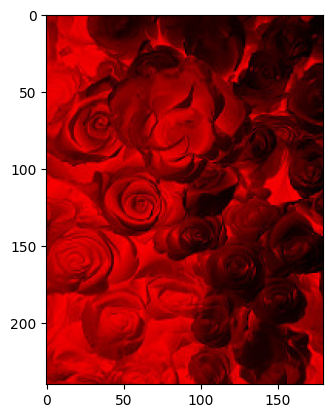

In [116]:
img_path = r"Flower Classification\Test\110472418_87b6a3aa98_m.jpg"

pred, prob, prob_for_all_class = make_individual_predictions(img_path, device, VGG_Custom)
print("Predicted Class: {}, with Predicted Probability of: {}.".format(n_classes[pred], prob))
print("Predicted Probabilities for Each Class: \n",prob_for_all_class)
ax = plt.subplot()
ax.imshow(Image.open(img_path))
plt.show()

<b> PREDICTIONS MADE BY PRETRAINED VGG19 

Predicted Class: rose, with Predicted Probability of: 0.9999852180480957.
Predicted Probabilities for Each Class: 
 {'daisy': 1.943462e-08, 'dandelion': 2.722418e-06, 'rose': 0.9999852, 'sunflower': 3.7585437e-09, 'tulip': 1.2060518e-05}


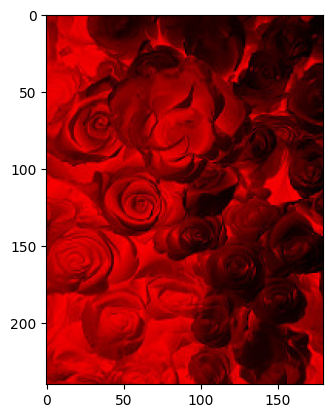

In [117]:
img_path = r"Flower Classification\Test\110472418_87b6a3aa98_m.jpg"

pred, prob, prob_for_all_class = make_individual_predictions(img_path, device, vgg19_pretrained)
print("Predicted Class: {}, with Predicted Probability of: {}.".format(n_classes[pred], prob))
print("Predicted Probabilities for Each Class: \n",prob_for_all_class)
ax = plt.subplot()
ax.imshow(Image.open(img_path))
plt.show()

### Individual Prediction 4

<b> PREDICTIONS MADE BY THE VGG19 TRAINED FROM SCRATCH

Predicted Class: rose, with Predicted Probability of: 0.8201496005058289.
Predicted Probabilities for Each Class: 
 {'daisy': 0.050419174, 'dandelion': 0.00597161, 'rose': 0.8201496, 'sunflower': 0.0034130963, 'tulip': 0.12004653}


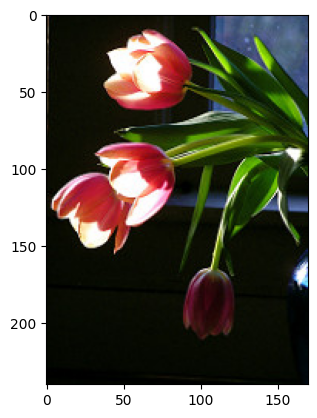

In [118]:
img_path = r"Flower Classification\Test\113960470_38fab8f2fb_m.jpg"

pred, prob, prob_for_all_class = make_individual_predictions(img_path, device, VGG_Custom)
print("Predicted Class: {}, with Predicted Probability of: {}.".format(n_classes[pred], prob))
print("Predicted Probabilities for Each Class: \n",prob_for_all_class)
ax = plt.subplot()
ax.imshow(Image.open(img_path))
plt.show()

<b> PREDICTIONS MADE BY PRETRAINED VGG19 

Predicted Class: tulip, with Predicted Probability of: 0.8167306780815125.
Predicted Probabilities for Each Class: 
 {'daisy': 0.16324136, 'dandelion': 0.0002718655, 'rose': 0.019185064, 'sunflower': 0.0005710468, 'tulip': 0.8167307}


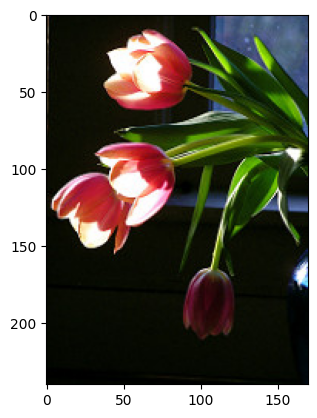

In [119]:
img_path = r"Flower Classification\Test\113960470_38fab8f2fb_m.jpg"

pred, prob, prob_for_all_class = make_individual_predictions(img_path, device, vgg19_pretrained)
print("Predicted Class: {}, with Predicted Probability of: {}.".format(n_classes[pred], prob))
print("Predicted Probabilities for Each Class: \n",prob_for_all_class)
ax = plt.subplot()
ax.imshow(Image.open(img_path))
plt.show()

### Individual Predicion 5

<b> PREDICTIONS MADE BY THE VGG19 TRAINED FROM SCRATCH

Predicted Class: daisy, with Predicted Probability of: 0.7628017067909241.
Predicted Probabilities for Each Class: 
 {'daisy': 0.7628017, 'dandelion': 0.03406669, 'rose': 0.13118899, 'sunflower': 0.01895561, 'tulip': 0.052986976}


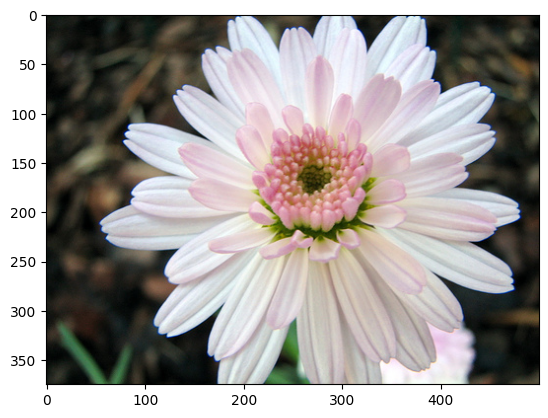

In [120]:
img_path = r"Flower Classification\Test\153210866_03cc9f2f36.jpg"

pred, prob, prob_for_all_class = make_individual_predictions(img_path, device, VGG_Custom)
print("Predicted Class: {}, with Predicted Probability of: {}.".format(n_classes[pred], prob))
print("Predicted Probabilities for Each Class: \n",prob_for_all_class)
ax = plt.subplot()
ax.imshow(Image.open(img_path))
plt.show()

<b> PREDICTIONS MADE BY PRETRAINED VGG19 

Predicted Class: daisy, with Predicted Probability of: 0.9992722868919373.
Predicted Probabilities for Each Class: 
 {'daisy': 0.9992723, 'dandelion': 1.8675715e-06, 'rose': 2.7194588e-07, 'sunflower': 0.0007254924, 'tulip': 1.6886469e-07}


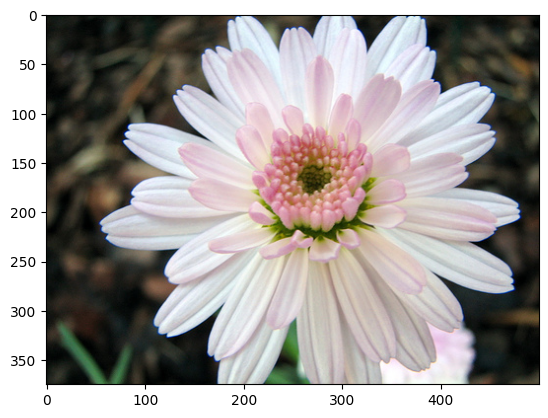

In [121]:
img_path = r"Flower Classification\Test\153210866_03cc9f2f36.jpg"

pred, prob, prob_for_all_class = make_individual_predictions(img_path, device, vgg19_pretrained)
print("Predicted Class: {}, with Predicted Probability of: {}.".format(n_classes[pred], prob))
print("Predicted Probabilities for Each Class: \n",prob_for_all_class)
ax = plt.subplot()
ax.imshow(Image.open(img_path))
plt.show()

# Conclusion